<a href="https://colab.research.google.com/github/jainam240101/Data-Science-Assignments/blob/main/Assignment_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Abstract

310 Observations, 13 Attributes (12 Numeric Predictors, 1 Binary Class Attribute - No Demographics)

Numerous issues with any section of the intricate, interrelated network of spinal muscles, nerves, bones, discs, or tendons in the lumbar spine can result in lower back discomfort. The following are typical causes of low back pain:

*   The large nerve roots in the low back that go to the legs may be irritated
*   The smaller nerves that supply the low back may be irritated
*   The large paired lower back muscles (erector spinae) may be strained
*   The bones, ligaments or joints may be damaged
*   An intervertebral disc may be degenerating

Lower back pain, as well as pain that radiates or is referred to other parts of the body, can be brought on by an irritation or issue with any of these tissues. Back muscle spasms, which may not seem like much but can cause excruciating pain and incapacity, are a common side effect of lower back disorders. 

Although lower back pain is very prevalent, there is a wide range in its symptoms and intensity. Simple lower back muscle strains may be so painful as to require a trip to the ER, whereas a degenerating disc may only cause minor, sporadic discomfort.

Using information about the physical spine that has been gathered, this data set will determine whether a person is abnormal or normal.

**Data Set**

This data set is about to identify a person is abnormal or normal using collected physical spine details/data.

The data set consists of :
1.   Twelve numerical features leading to Spine problem
2.   Class attribute indicates if the person has a spine problem or not
3.   There are a total of 311 observations.


In [94]:
import warnings
warnings.filterwarnings(action='ignore')
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier, plot_importance
from sklearn.model_selection import train_test_split

In [95]:
url = 'https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv'
dataset = pd.read_csv(url, index_col=0)

In [96]:

dataset.head()
     

,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,Unnamed: 13
Col1,,,,,,,,,,,,,
63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal,NaN
39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal,NaN
68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal,Prediction is done by using binary classificat...
69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal,NaN
49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal,NaN


In [97]:
dataset.iloc[:,-1:].head()

,Unnamed: 13
Col1,
63.027817,NaN
39.056951,NaN
68.832021,Prediction is done by using binary classificat...
69.297008,NaN
49.712859,NaN


In [98]:
del dataset["Unnamed: 13"]

In [99]:
dataset.rename(columns = {
    "Col1" : "pelvic_incidence", 
    "Col2" : "pelvic_tilt",
    "Col3" : "lumbar_lordosis_angle",
    "Col4" : "sacral_slope", 
    "Col5" : "pelvic_radius",
    "Col6" : "degree_spondylolisthesis", 
    "Col7" : "pelvic_slope",
    "Col8" : "direct_tilt",
    "Col9" : "thoracic_slope", 
    "Col10" :"cervical_tilt", 
    "Col11" : "sacrum_angle",
    "Col12" : "scoliosis_slope", 
    "Class_att" : "class"}, inplace=True)
     
dataset.head()

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope,class
Col1,,,,,,,,,,,,
63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal
39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal
68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal
69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal
49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal


In [100]:
dataset.isnull().sum()

pelvic_tilt                 0
lumbar_lordosis_angle       0
sacral_slope                0
pelvic_radius               0
degree_spondylolisthesis    0
pelvic_slope                0
direct_tilt                 0
thoracic_slope              0
cervical_tilt               0
sacrum_angle                0
scoliosis_slope             0
class                       0
dtype: int64

No data is missing from any of the columns, which means it is not required to impute or remove the null values from the data


In [101]:
for col in dataset.columns:
    print("Column:",col, "\n\n", dataset[col].value_counts(),"\n")

Column: pelvic_tilt 

 22.552586    1
14.377189    1
18.968430    1
16.964297    1
16.417462    1
            ..
13.469986    1
18.774071    1
30.361685    1
13.922286    1
5.073991     1
Name: pelvic_tilt, Length: 310, dtype: int64 

Column: lumbar_lordosis_angle 

 52.000000    4
42.000000    4
47.000000    4
35.000000    4
37.000000    3
            ..
67.900000    1
48.500000    1
86.960602    1
48.384057    1
36.641233    1
Name: lumbar_lordosis_angle, Length: 280, dtype: int64 

Column: sacral_slope 

 35.417055    3
56.309932    3
45.000000    3
33.111342    3
35.655328    2
            ..
55.388858    1
48.576334    1
50.477369    1
44.144903    1
28.767649    1
Name: sacral_slope, Length: 281, dtype: int64 

Column: pelvic_radius 

 98.672917     1
101.723334    1
125.846646    1
127.632875    1
94.882336     1
             ..
102.337524    1
114.787107    1
108.010218    1
115.514798    1
123.945244    1
Name: pelvic_radius, Length: 310, dtype: int64 

Column: degree_spondylo

In [102]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 310 entries, 63.0278175 to 33.84164075
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   pelvic_tilt               310 non-null    float64
 1   lumbar_lordosis_angle     310 non-null    float64
 2   sacral_slope              310 non-null    float64
 3   pelvic_radius             310 non-null    float64
 4   degree_spondylolisthesis  310 non-null    float64
 5   pelvic_slope              310 non-null    float64
 6   direct_tilt               310 non-null    float64
 7   thoracic_slope            310 non-null    float64
 8   cervical_tilt             310 non-null    float64
 9   sacrum_angle              310 non-null    float64
 10  scoliosis_slope           310 non-null    float64
 11  class                     310 non-null    object 
dtypes: float64(11), object(1)
memory usage: 31.5+ KB


In [103]:
dataset.describe()

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,17.542822,51.930930,42.953831,117.920655,26.296694,0.472979,21.321526,13.064511,11.933317,-14.053139,25.645981
std,10.008330,18.554064,13.423102,13.317377,37.559027,0.285787,8.639423,3.399713,2.893265,12.225582,10.450558
min,-6.554948,14.000000,13.366931,70.082575,-11.058179,0.003220,7.027000,7.037800,7.030600,-35.287375,7.007900
25%,10.667069,37.000000,33.347122,110.709196,1.603727,0.224367,13.054400,10.417800,9.541140,-24.289522,17.189075
50%,16.357689,49.562398,42.404912,118.268178,11.767934,0.475989,21.907150,12.938450,11.953835,-14.622856,24.931950
75%,22.120395,63.000000,52.695888,125.467674,41.287352,0.704846,28.954075,15.889525,14.371810,-3.497094,33.979600
max,49.431864,125.742385,121.429566,163.071041,418.543082,0.998827,36.743900,19.324000,16.821080,6.972071,44.341200


In [104]:
categorical_features= dataset.describe(include=['object'])
categorical_features
     

,class
count,310
unique,2
top,Abnormal
freq,210


           pelvic_tilt  lumbar_lordosis_angle  sacral_slope  pelvic_radius  \
Col1                                                                         
63.027817    22.552586              39.609117     40.475232      98.672917   
39.056951    10.060991              25.015378     28.995960     114.405425   
68.832021    22.218482              50.092194     46.613539     105.985135   
69.297008    24.652878              44.311238     44.644130     101.868495   
49.712859     9.652075              28.317406     40.060784     108.168725   
...                ...                    ...           ...            ...   
47.903565    13.616688              36.000000     34.286877     117.449062   
53.936748    20.721496              29.220534     33.215251     114.365845   
61.446597    22.694968              46.170347     38.751628     125.670725   
45.252792     8.693157              41.583126     36.559635     118.545842   
33.841641     5.073991              36.641233     28.767649     

<Figure size 800x500 with 0 Axes>

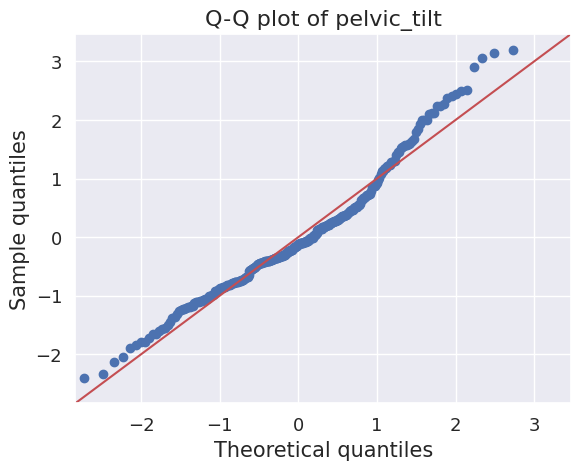

lumbar_lordosis_angle


<Figure size 800x500 with 0 Axes>

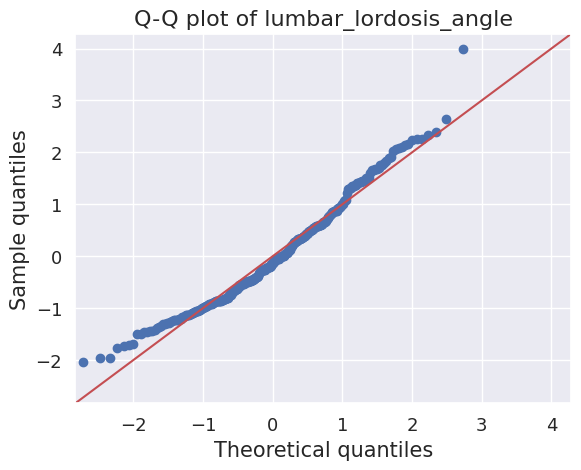

sacral_slope


<Figure size 800x500 with 0 Axes>

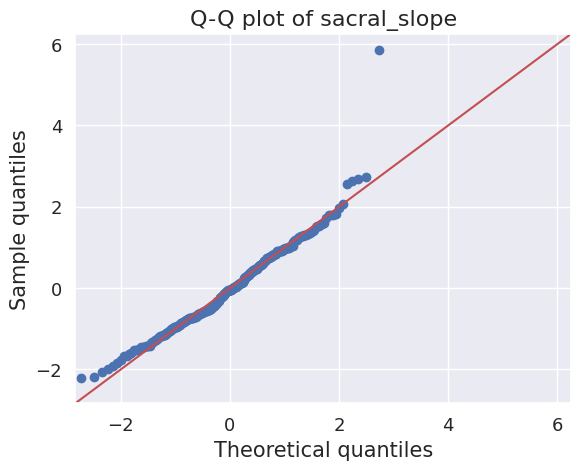

pelvic_radius


<Figure size 800x500 with 0 Axes>

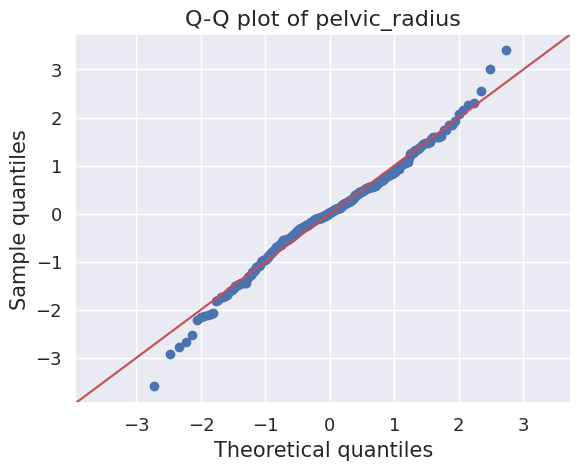

degree_spondylolisthesis


<Figure size 800x500 with 0 Axes>

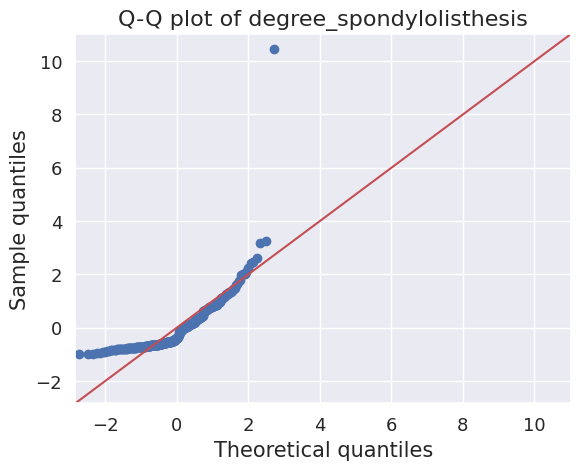

pelvic_slope


<Figure size 800x500 with 0 Axes>

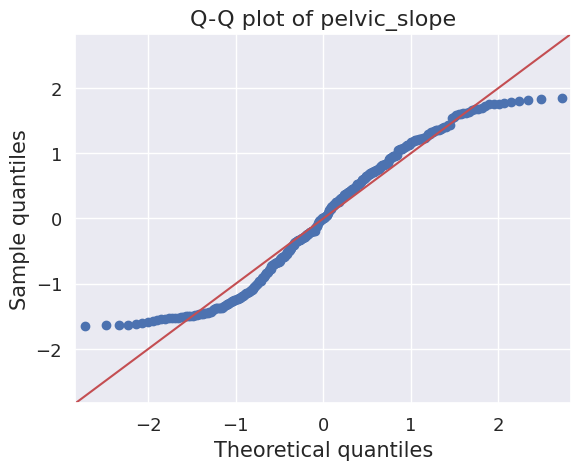

direct_tilt


<Figure size 800x500 with 0 Axes>

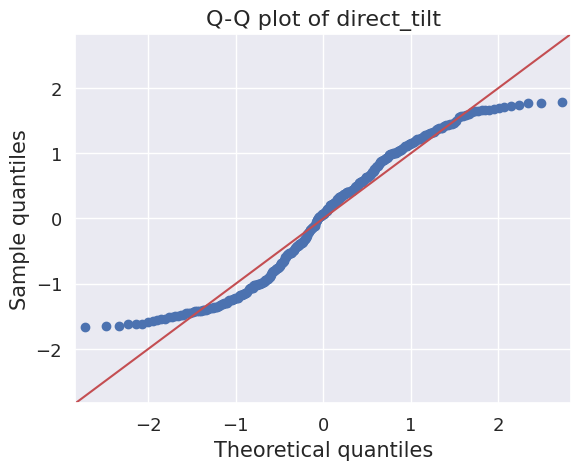

thoracic_slope


<Figure size 800x500 with 0 Axes>

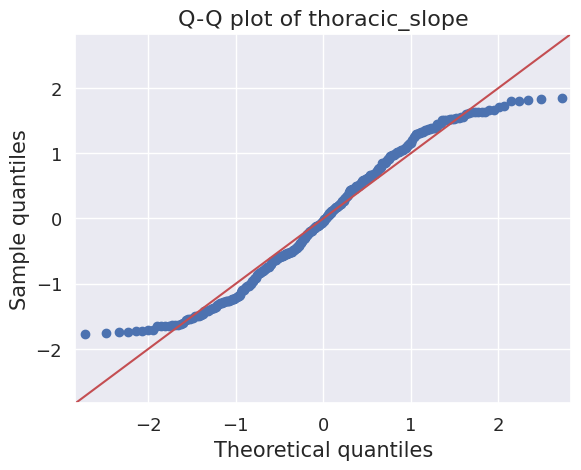

cervical_tilt


<Figure size 800x500 with 0 Axes>

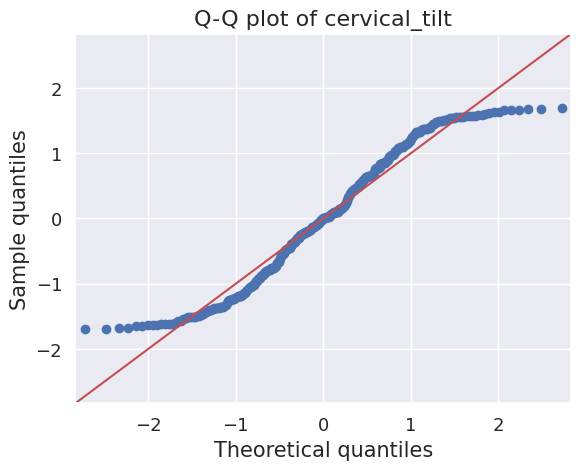

sacrum_angle


<Figure size 800x500 with 0 Axes>

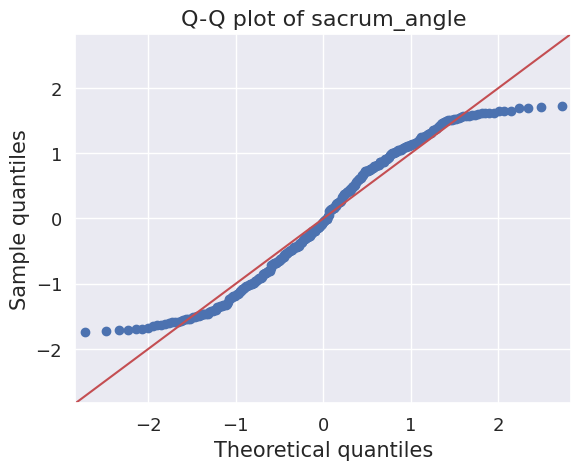

scoliosis_slope


<Figure size 800x500 with 0 Axes>

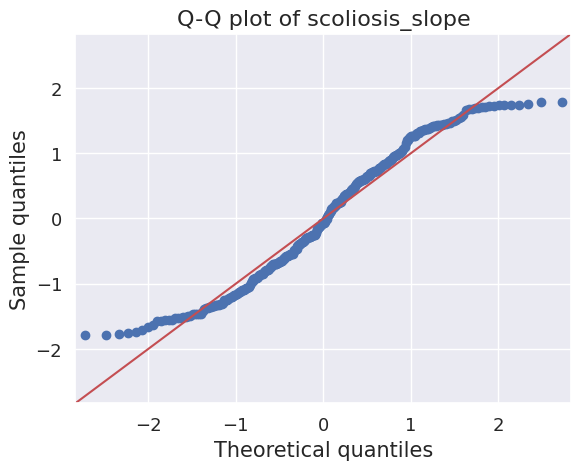

In [105]:
from statsmodels.graphics.gofplots import qqplot
data_norm=dataset[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']]
print(data_norm)
for c in data_norm.columns[:]:
    print(c)
    plt.figure(figsize=(8,5))
    fig=qqplot(data_norm[c],line='45',fit='True')
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles",fontsize=15)
    plt.ylabel("Sample quantiles",fontsize=15)
    plt.title("Q-Q plot of {}".format(c),fontsize=16)
    plt.grid(True)
    plt.show()

In [106]:
dataset

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope,class
Col1,,,,,,,,,,,,
63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal
39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal
68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal
69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal
49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal
...,...,...,...,...,...,...,...,...,...,...,...,...
47.903565,13.616688,36.000000,34.286877,117.449062,-4.245395,0.129744,7.8433,14.7484,8.51707,-15.728927,11.5472,Normal
53.936748,20.721496,29.220534,33.215251,114.365845,-0.421010,0.047913,19.1986,18.1972,7.08745,6.013843,43.8693,Normal
61.446597,22.694968,46.170347,38.751628,125.670725,-2.707880,0.081070,16.2059,13.5565,8.89572,3.564463,18.4151,Normal


In [107]:
dataset["class"].value_counts()


Abnormal    210
Normal      100
Name: class, dtype: int64

<Axes: >

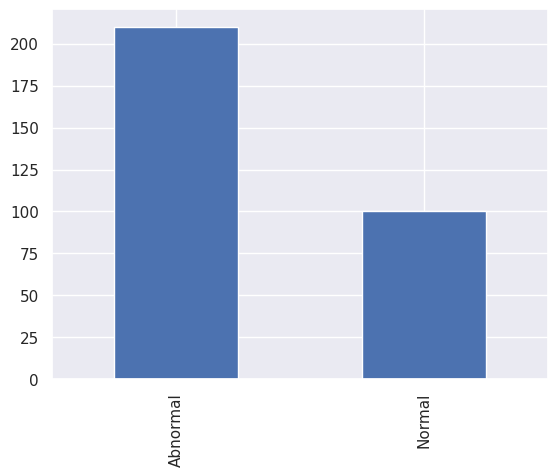

In [108]:
dataset["class"].value_counts().sort_index().plot.bar()

In [109]:
dataset.groupby('class').mean()

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope
class,,,,,,,,,,,
Abnormal,19.791111,55.925370,44.90145,115.077713,37.777705,0.483979,21.085875,12.948913,12.132737,-13.826677,25.146915
Normal,12.821414,43.542605,38.86383,123.890834,2.186572,0.449880,21.816394,13.307268,11.514534,-14.528712,26.694019


**We will use 3 methods to check if the independent variables are useful to precict a target-**
1. Correlation Analysis

<Axes: >

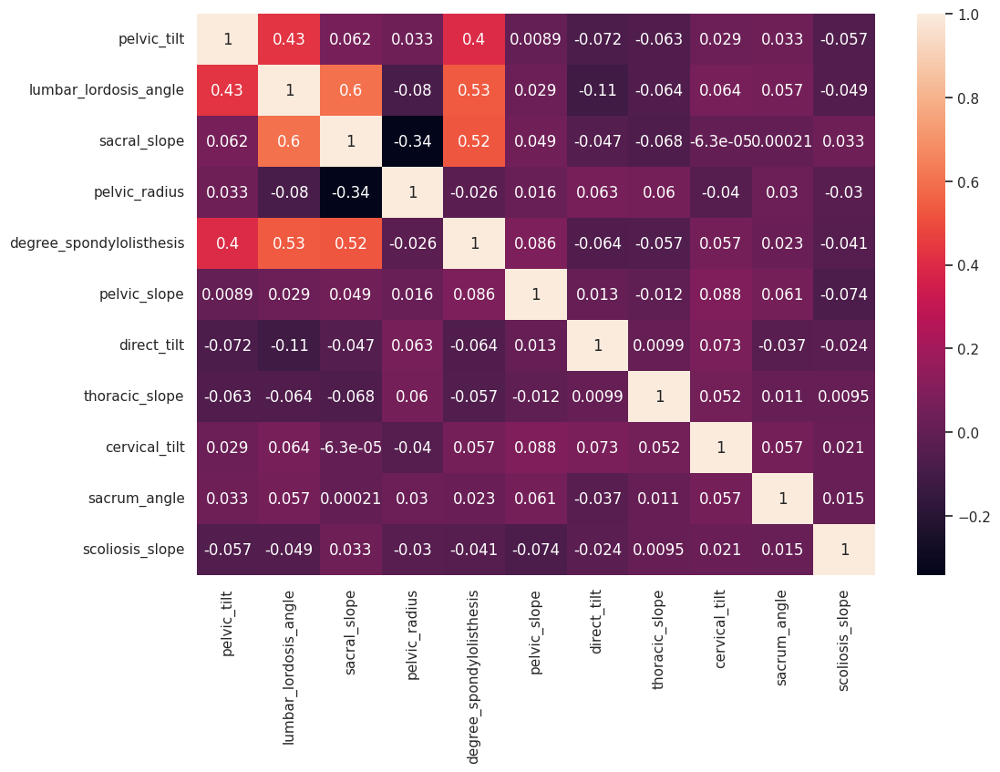

In [110]:
corr = dataset.corr()
plt.subplots(figsize=(12,8))
sns.heatmap(dataset.corr(), annot=True)


2. Subplotting X variables against the Y to check the relation

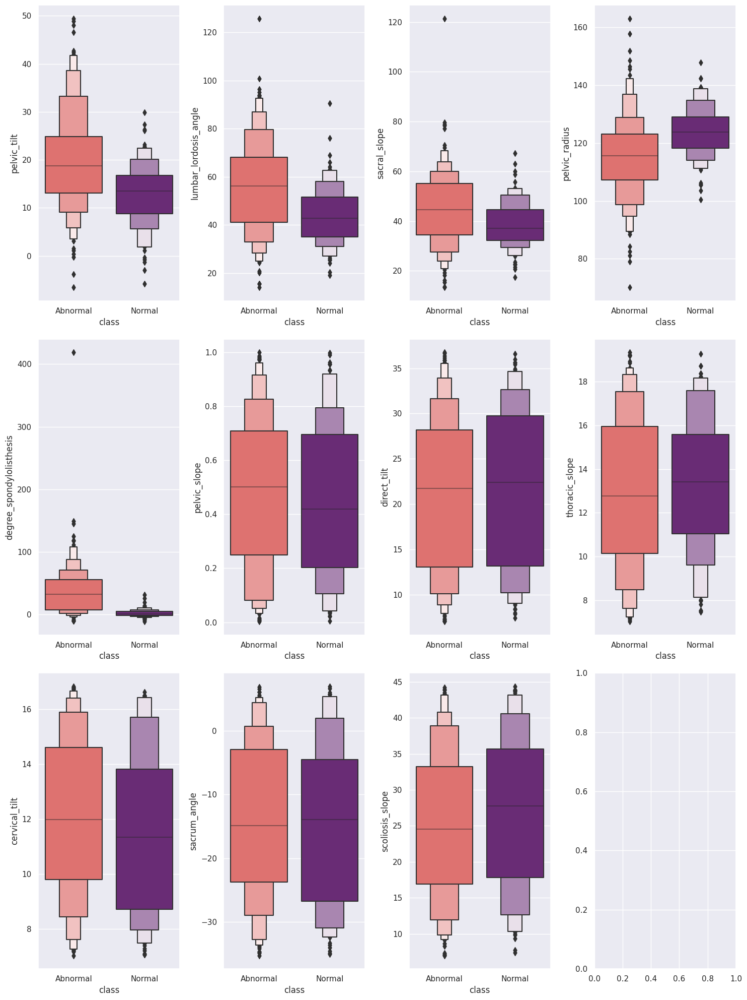

In [111]:
fig, axes = plt.subplots(3, 4, figsize = (15,20))
axes = axes.flatten()

for i in range(0,len(dataset.columns)-1):
    sns.boxenplot(x="class", y=dataset.iloc[:,i], data=dataset, orient='v', ax=axes[i],palette="magma_r")

plt.tight_layout()
plt.show()


In [112]:
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[1]):
        if abs(corr.iloc[i, j]) > 0.8:
            print(f"Predictor variables {corr.columns[i]} and {corr.columns[j]} are highly correlated.")

So we can observe here that Pelvic Incidence and Sacral Slope are highly are higly correlated as the predictor variables have a correlation value greater than 0.8 so predictor variables are 
dependent of all the other predictor variables

In [113]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
predictors = ['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']
X = dataset[predictors].values

vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
for idx, val in enumerate(vif):
    print(f"VIF for {predictors[idx]}: {val}")

VIF for pelvic_tilt: 5.842415976978518
VIF for lumbar_lordosis_angle: 19.372434331390146
VIF for sacral_slope: 19.860515397919542
VIF for pelvic_radius: 34.36156010422566
VIF for degree_spondylolisthesis: 2.4348251631835693
VIF for pelvic_slope: 3.8117359143301393
VIF for direct_tilt: 7.223879846009522
VIF for thoracic_slope: 15.037919705594375
VIF for cervical_tilt: 16.777653169234224
VIF for sacrum_angle: 2.3172061384407523
VIF for scoliosis_slope: 6.955541793792665


A VIF of 1 indicates that there is no multicollinearity between the predictor variable and the other predictor variables in the model. A VIF greater than 1 indicates that the predictor variable is correlated with one or more other predictor variables in the model.

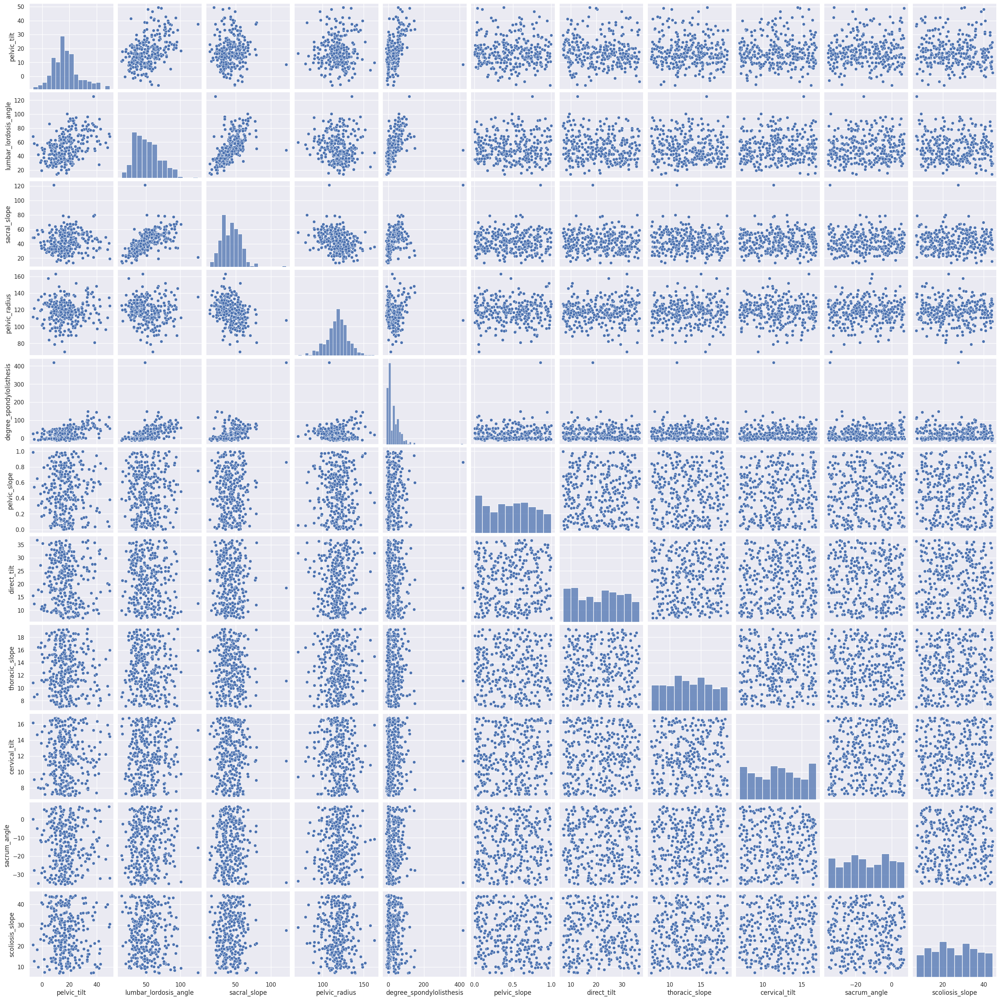

In [114]:
sns.pairplot(dataset)

<Axes: >

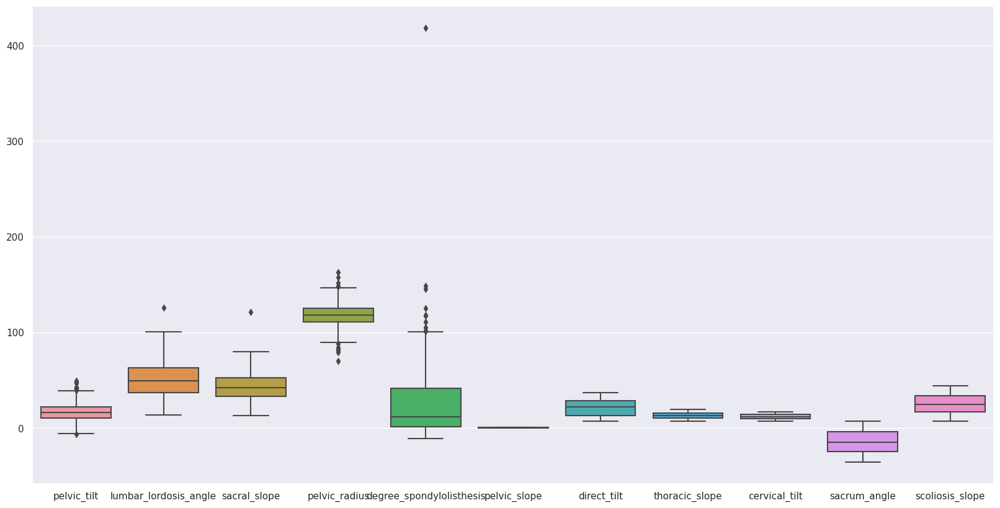

In [115]:
plt.figure(figsize=(20,10))
sns.boxplot(data=dataset)
     

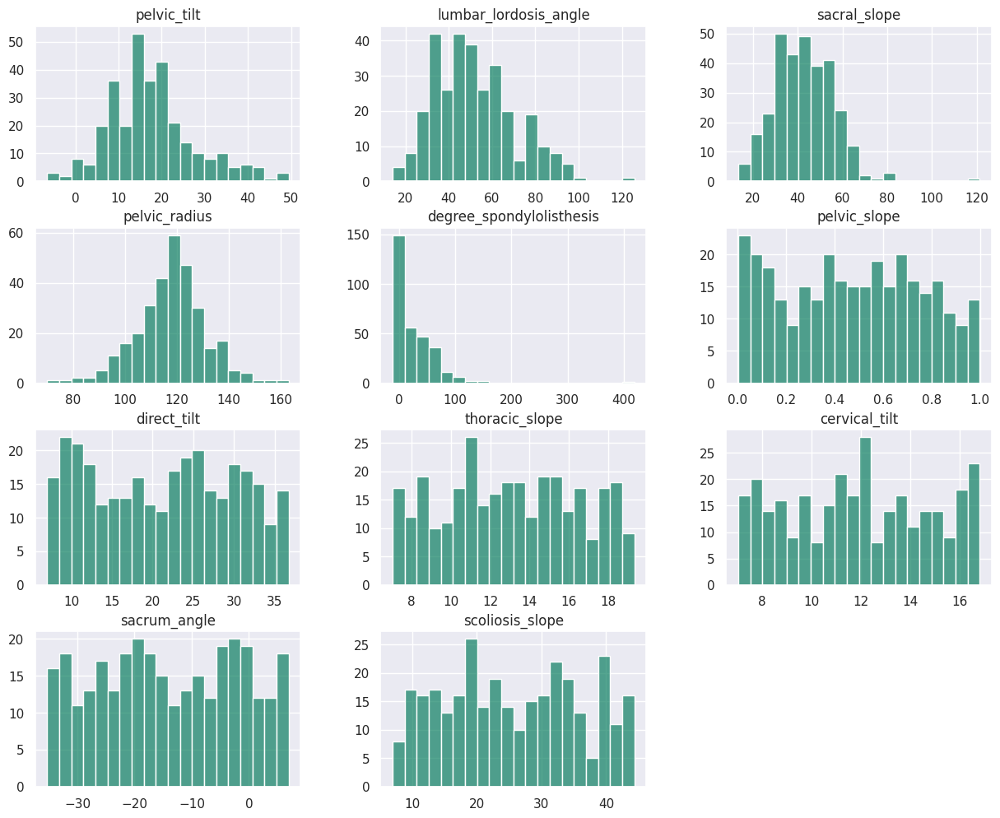

In [116]:
dataset.hist(figsize=(15,12),bins = 20, color="#007959AA")
plt.title("Features Distribution")
plt.show()

In [117]:
minimum = 0
maximum = 0

def detect_outlier(feature):
    first_q = np.percentile(feature, 25)
    third_q = np.percentile(feature, 75) 
    IQR = third_q - first_q
    IQR *= 1.5
    minimum = first_q - IQR 
    maximum = third_q + IQR
    flag = False
    
    if(minimum > np.min(feature)):
        flag = True
    if(maximum < np.max(feature)):
        flag = True
    
    return flag
     

In [118]:
X = dataset.iloc[:, :-1]
for i in range(len(X.columns)):
    if(detect_outlier(X[X.columns[i]])):
        print(X.columns[i], "Contains Outlier")
     

pelvic_tilt Contains Outlier
lumbar_lordosis_angle Contains Outlier
sacral_slope Contains Outlier
pelvic_radius Contains Outlier
degree_spondylolisthesis Contains Outlier


In [119]:

def remove_outlier(feature):
    first_q = np.percentile(X[feature], 25)
    third_q = np.percentile(X[feature], 75)
    IQR = third_q - first_q
    IQR *= 1.5
    
    minimum = first_q - IQR # the acceptable minimum value
    maximum = third_q + IQR # the acceptable maximum value
    
    median = X[feature].median()
    
    X.loc[X[feature] < minimum, feature] = median 
    X.loc[X[feature] > maximum, feature] = median

for i in range(len(X.columns)): 
        remove_outlier(X.columns[i])
     

In [120]:

for i in range (3):
    for i in range(len(X.columns)):
        remove_outlier(X.columns[i])

<Axes: >

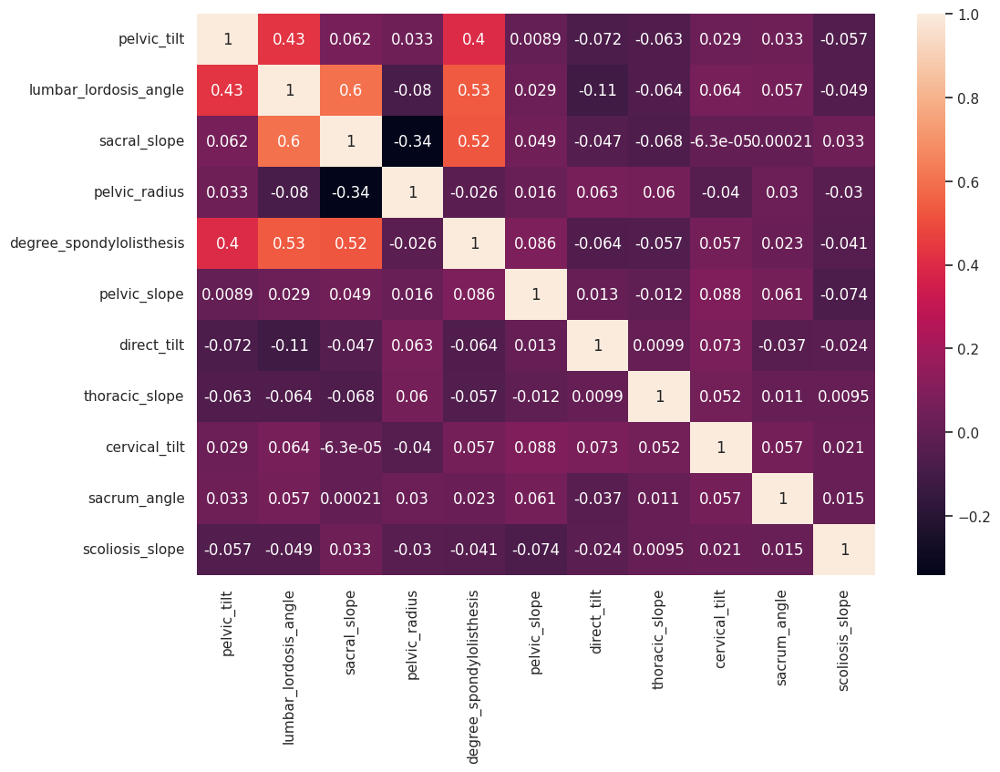

In [121]:
corr = dataset.corr()
plt.subplots(figsize=(12,8))
sns.heatmap(dataset.corr(), annot=True)

After removing outliers we compare the correlation matrix and it is same so we see that removing outliers is not gonna make a difference

In [122]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(X)
scaled_df = pd.DataFrame(data = scaled_data, columns = X.columns)
scaled_df.head()

,pelvic_tilt,lumbar_lordosis_angle,sacral_slope,pelvic_radius,degree_spondylolisthesis,pelvic_slope,direct_tilt,thoracic_slope,cervical_tilt,sacrum_angle,scoliosis_slope
0,0.684601,0.295226,0.408699,0.099877,0.108734,0.744554,0.186396,0.610506,0.845115,0.156861,0.977797
1,0.349535,0.126987,0.235632,0.415357,0.157231,0.413783,0.197208,0.854170,0.996300,0.230878,0.243812
2,0.675639,0.416076,0.501244,0.246507,0.075764,0.473750,0.666533,0.850409,0.983442,0.148026,0.327166
3,0.740938,0.349432,0.471552,0.163957,0.224132,0.367741,0.556360,0.461461,0.448790,0.113989,0.316741
4,0.338566,0.165053,0.402451,0.290294,0.190990,0.542524,0.957940,0.725757,0.188118,0.447450,0.479711


In [123]:
from scipy.stats import skew
features_index = X.dtypes[X.dtypes != 'object'].index

skew_features = X[features_index].apply(lambda x : skew(x))
skew_features_top = skew_features[skew_features> 0]
print(skew_features_top.sort_values(ascending=False))
     

degree_spondylolisthesis    0.863313
lumbar_lordosis_angle       0.465611
sacral_slope                0.228751
pelvic_tilt                 0.200448
scoliosis_slope             0.063905
thoracic_slope              0.022934
pelvic_slope                0.016152
cervical_tilt               0.014944
direct_tilt                 0.010743
dtype: float64


As we are splitting the data with 80% as training and 20% as testing so there is no similar data in training data and testing data

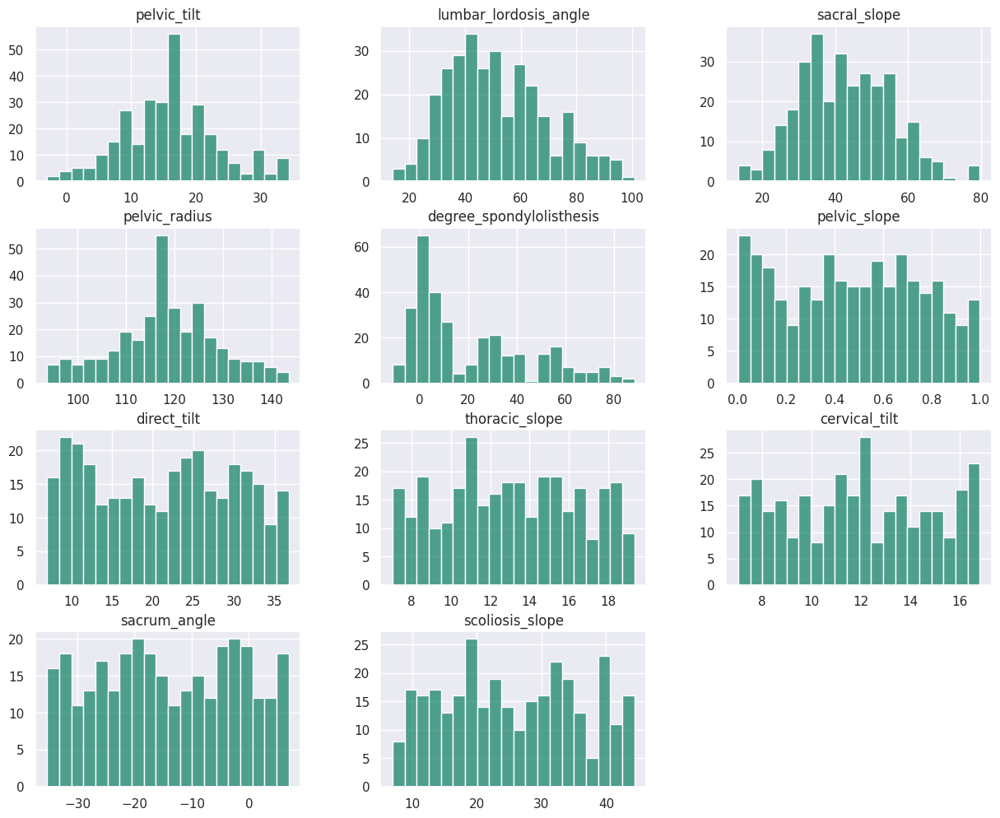

In [124]:
X.hist(figsize=(15,12),bins = 20, color="#007959AA")
plt.title("Features Distribution")
plt.show()

In [125]:
label = dataset["class"]
encoder = LabelEncoder()

label = encoder.fit_transform(label)
label
     

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [126]:
X = scaled_df
y = label 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

In [127]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set

clf.fit(X_train, y_train)
     

RandomForestClassifier(random_state=0)

In [128]:
feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

feature_scores
     

degree_spondylolisthesis    0.300503
pelvic_radius               0.135644
lumbar_lordosis_angle       0.106772
sacral_slope                0.097356
pelvic_tilt                 0.077714
sacrum_angle                0.053182
thoracic_slope              0.049092
scoliosis_slope             0.048323
cervical_tilt               0.047983
pelvic_slope                0.041914
direct_tilt                 0.041516
dtype: float64

In [129]:

from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

log_rg = LogisticRegression().fit(X_train, y_train)
cross_val_score(log_rg, X_train, y_train, cv=5)
print(log_rg.score(X_test, y_test))
print(classification_report(y_test, log_rg.predict(X_test)))

feature_importance_lr = pd.DataFrame(zip(X.columns.values, log_rg.coef_.ravel()))
feature_importance_lr.columns = ['feature', 'coef']
feature_importance_lr.sort_values("coef", ascending=False, inplace=True)


0.8387096774193549
              precision    recall  f1-score   support

           0       0.82      0.98      0.89        42
           1       0.92      0.55      0.69        20

    accuracy                           0.84        62
   macro avg       0.87      0.76      0.79        62
weighted avg       0.85      0.84      0.83        62



In [130]:
from sklearn.metrics import mean_squared_error

def print_accuracy(accuracy_score, score_text=False):
    clean_accuracy = accuracy_score*100.0
    if score_text:
        clean_text = score_text.strip() + ' '
        print('{}{:.2f}%'.format(clean_text, clean_accuracy))
    else:
        print('{:.2f}%'.format(clean_accuracy))

def get_rmse(model):
    pred = model.predict(X_test)
    mse = mean_squared_error(y_test ,pred)
    rmse = np.sqrt(mse)
    print('{0} MSE : {1}'.format(model.__class__.__name__,np.round(mse, 2)))
    print('{0} RMSE : {1}'.format(model.__class__.__name__,np.round(rmse, 2)))
    return mse, rmse

In [131]:

!pip install category-encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 2.8 MB/s eta 0:00:00


In [132]:
import category_encoders as ce
# encode categorical variables with one-hot encoding

encoder = ce.OneHotEncoder(cols=['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope'])

X_train = encoder.fit_transform(X_train)

X_test = encoder.transform(X_test)
X_train.head()


,pelvic_tilt_1,pelvic_tilt_2,pelvic_tilt_3,pelvic_tilt_4,pelvic_tilt_5,pelvic_tilt_6,pelvic_tilt_7,pelvic_tilt_8,pelvic_tilt_9,pelvic_tilt_10,...,scoliosis_slope_239,scoliosis_slope_240,scoliosis_slope_241,scoliosis_slope_242,scoliosis_slope_243,scoliosis_slope_244,scoliosis_slope_245,scoliosis_slope_246,scoliosis_slope_247,scoliosis_slope_248
157,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
143,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
285,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
160,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [133]:
from sklearn.tree import DecisionTreeClassifier

tree_model = DecisionTreeClassifier(random_state = 1000).fit(X_train, y_train)


tree_pred = tree_model.predict(X_test)
print_accuracy(accuracy_score(y_test, tree_pred), 'Decision tree accuracy:')

Decision tree accuracy: 67.74%


In [134]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth': [i for i in range(1, 11)], 
              'max_features': [i for i in range(1, 8)], 
              'min_samples_leaf': [i for i in range(1, 11)]}

dt_grid = GridSearchCV(DecisionTreeClassifier(random_state = 1000), param_grid=param_grid, cv=10, return_train_score = True, n_jobs=-1)
     

In [135]:
dt_grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=1000),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'max_features': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
             return_train_score=True)

In [136]:
print("Best Score: {}%".format(round(dt_grid.best_score_*100.0, 2)))
print("Best params: {}".format(dt_grid.best_params_))

Best Score: 67.73%
Best params: {'max_depth': 1, 'max_features': 1, 'min_samples_leaf': 1}


In [137]:
y_pred = dt_grid.best_estimator_.predict(X_test)
print_accuracy(accuracy_score(y_test,y_pred), 'Decision Tree Classifier:')

Decision Tree Classifier: 67.74%


In [138]:
get_rmse(tree_model)
print('')
get_rmse(dt_grid)

DecisionTreeClassifier MSE : 0.32
DecisionTreeClassifier RMSE : 0.57

GridSearchCV MSE : 0.32
GridSearchCV RMSE : 0.57


(0.3225806451612903, 0.5679618342470648)

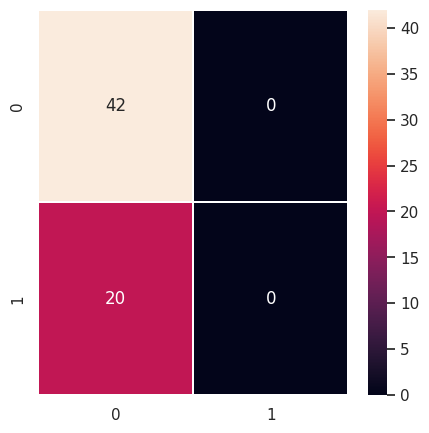

              precision    recall  f1-score   support

           0       0.68      1.00      0.81        42
           1       0.00      0.00      0.00        20

    accuracy                           0.68        62
   macro avg       0.34      0.50      0.40        62
weighted avg       0.46      0.68      0.55        62



In [139]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score,confusion_matrix

cm = confusion_matrix(y_test,dt_grid.predict(X_test))

plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True,linewidths=.3)
plt.show()

print(classification_report(y_test,dt_grid.predict(X_test)))

In [140]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier

rf = RandomForestClassifier()
rf.fit(X_train,y_train)
print_accuracy(accuracy_score(y_test, rf.predict(X_test)), 'RF accuracy:')
     

RF accuracy: 67.74%


In [141]:
l = ["gini","entropy"]

grid = {"criterion":l,
        "n_estimators":range(1,20), 
        'max_depth' : [6,8,10,12],
        'min_samples_leaf':[2,4,6,8]}


rf_cv = GridSearchCV(estimator = rf , param_grid = grid , cv = 5, n_jobs=-1)
rf_cv.fit(X_train,y_train)

print(rf_cv.best_params_)
print(rf_cv.best_score_)
     

{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 2, 'n_estimators': 2}
0.681469387755102


In [142]:
y_pred = rf_cv.predict(X_test)
print_accuracy(accuracy_score(y_test,y_pred), "RF accuracy : ")

RF accuracy : 67.74%


In [143]:
get_rmse(rf_cv)

GridSearchCV MSE : 0.32
GridSearchCV RMSE : 0.57


(0.3225806451612903, 0.5679618342470648)

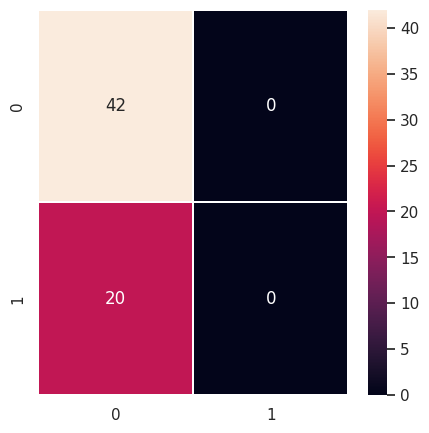

              precision    recall  f1-score   support

           0       0.68      1.00      0.81        42
           1       0.00      0.00      0.00        20

    accuracy                           0.68        62
   macro avg       0.34      0.50      0.40        62
weighted avg       0.46      0.68      0.55        62



In [144]:
plt.figure(figsize=(5,5))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,linewidths=.3)
plt.show()

print(classification_report(y_test,y_pred))

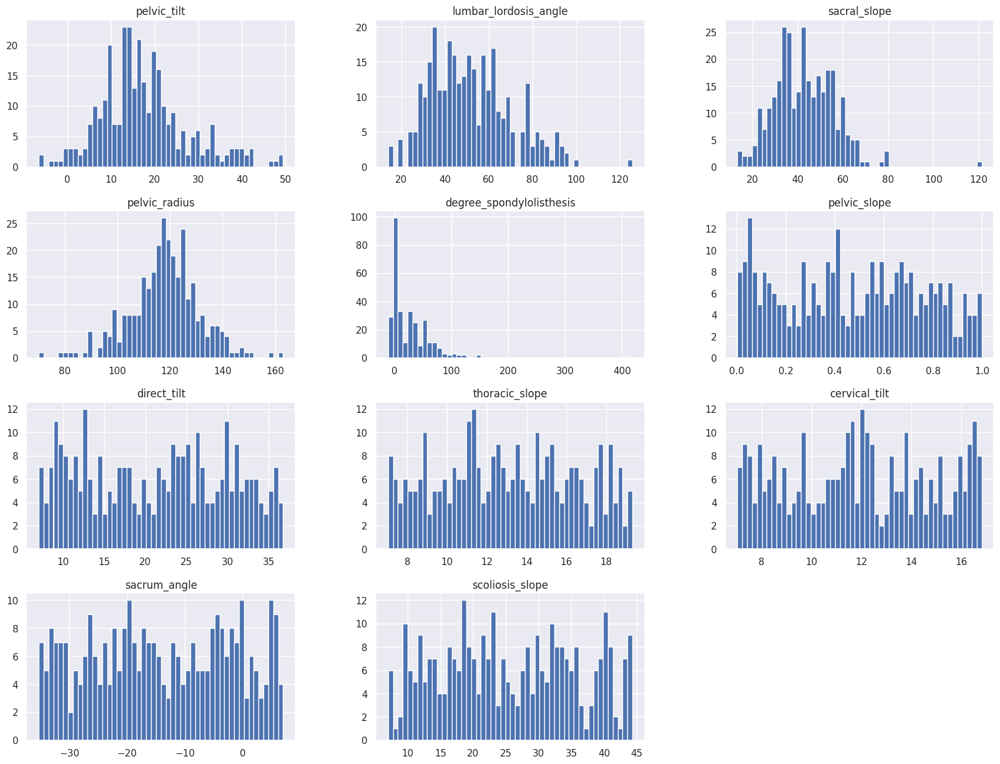

In [145]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(dataset[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])

dataset[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']].hist(bins=50, figsize=(20,15))
plt.show()

**Removing 1%, 5%, and 10% of the data randomly and imputing the values back using at least 3 imputation methods.**

**Our idea:**
____________

The code splits the data into predictor variables and target variable, removes a percentage of the data randomly, imputes the missing values using three imputation methods (mean, KNN, and iterative), fits a linear regression model to the complete data, and makes predictions on the missing values using the three imputed datasets. Finally, it calculates the mean absolute error (MAE) and mean squared error (MSE) for each imputation method, which can be used to compare the performance of the model on the three imputed datasets.

In [146]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
string_columns = dataset[['class']]

encoded_columns = string_columns.apply(encoder.fit_transform)

# Replace the original columns with the encoded columns
dataset[['class']] = encoded_columns

In [147]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

df = dataset

X = df[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']]
y = df['class']

percentage = 0.01
missing_rows = np.random.choice(df.index, int(df.shape[0] * percentage), replace=False)
df_missing = df.loc[missing_rows]
df = df.drop(missing_rows)

mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

X_mean = mean_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_knn = knn_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_iter = iter_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])

model = LinearRegression()

model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

mae_mean = mean_absolute_error(df_missing['class'], y_pred_mean)
mse_mean = mean_squared_error(df_missing['class'], y_pred_mean)
mae_knn = mean_absolute_error(df_missing['class'], y_pred_knn)
mse_knn = mean_squared_error(df_missing['class'], y_pred_knn)
mae_iter = mean_absolute_error(df_missing['class'], y_pred_iter)
mse_iter = mean_squared_error(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imput : MAE = {mae_knn}, MSE = {mse_knn}')


def calc_bias_variance(y, y_pred):
  y_mean = np.mean(y)
  bias = np.mean((y_mean - y_pred)**2)
  variance = np.mean((y_pred - y_mean)**2)
  return bias, variance

bias_mean, variance_mean = calc_bias_variance(df_missing['class'], y_pred_mean)
bias_knn, variance_knn = calc_bias_variance(df_missing['class'], y_pred_knn)
bias_iter, variance_iter = calc_bias_variance(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: Bias = {bias_mean}, Variance = {variance_mean}')
print(f'KNN Imput : Bias = {bias_knn}, Variance = {variance_knn}')
print(f'Iterative Imputation: Bias = {bias_iter}, Variance = {variance_iter}')


Mean Imputation: MAE = 0.247894738348027, MSE = 0.06953668603770291
KNN Imput : MAE = 0.247894738348027, MSE = 0.06953668603770291
Mean Imputation: Bias = 0.06953668603770291, Variance = 0.06953668603770291
KNN Imput : Bias = 0.06953668603770291, Variance = 0.06953668603770291
Iterative Imputation: Bias = 0.06953668603770291, Variance = 0.06953668603770291


In [148]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

df = dataset

X = df[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']]
y = df['class']

percentage = 0.05
missing_rows = np.random.choice(df.index, int(df.shape[0] * percentage), replace=False)
df_missing = df.loc[missing_rows]
df = df.drop(missing_rows)

mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

X_mean = mean_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_knn = knn_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_iter = iter_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])

model = LinearRegression()

model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

mae_mean = mean_absolute_error(df_missing['class'], y_pred_mean)
mse_mean = mean_squared_error(df_missing['class'], y_pred_mean)
mae_knn = mean_absolute_error(df_missing['class'], y_pred_knn)
mse_knn = mean_squared_error(df_missing['class'], y_pred_knn)
mae_iter = mean_absolute_error(df_missing['class'], y_pred_iter)
mse_iter = mean_squared_error(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imput : MAE = {mae_knn}, MSE = {mse_knn}')


def calc_bias_variance(y, y_pred):
  y_mean = np.mean(y)
  bias = np.mean((y_mean - y_pred)**2)
  variance = np.mean((y_pred - y_mean)**2)
  return bias, variance

bias_mean, variance_mean = calc_bias_variance(df_missing['class'], y_pred_mean)
bias_knn, variance_knn = calc_bias_variance(df_missing['class'], y_pred_knn)
bias_iter, variance_iter = calc_bias_variance(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: Bias = {bias_mean}, Variance = {variance_mean}')
print(f'KNN Imput : Bias = {bias_knn}, Variance = {variance_knn}')
print(f'Iterative Imputation: Bias = {bias_iter}, Variance = {variance_iter}')

Mean Imputation: MAE = 0.3038287463195001, MSE = 0.10290312174174644
KNN Imput : MAE = 0.3038287463195001, MSE = 0.10290312174174644
Mean Imputation: Bias = 0.07409495286625054, Variance = 0.07409495286625054
KNN Imput : Bias = 0.07409495286625054, Variance = 0.07409495286625054
Iterative Imputation: Bias = 0.07409495286625054, Variance = 0.07409495286625054


In [149]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer, KNNImputer

df = dataset

X = df[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']]
y = df['class']

percentage = 0.1
missing_rows = np.random.choice(df.index, int(df.shape[0] * percentage), replace=False)
df_missing = df.loc[missing_rows]
df = df.drop(missing_rows)

mean_imputer = SimpleImputer(strategy='mean')
knn_imputer = KNNImputer()
iter_imputer = IterativeImputer()

X_mean = mean_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_knn = knn_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])
X_iter = iter_imputer.fit_transform(df_missing[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']])

model = LinearRegression()

model.fit(X, y)
y_pred = model.predict(X)
y_pred_mean = model.predict(X_mean)
y_pred_knn = model.predict(X_knn)
y_pred_iter = model.predict(X_iter)

mae_mean = mean_absolute_error(df_missing['class'], y_pred_mean)
mse_mean = mean_squared_error(df_missing['class'], y_pred_mean)
mae_knn = mean_absolute_error(df_missing['class'], y_pred_knn)
mse_knn = mean_squared_error(df_missing['class'], y_pred_knn)
mae_iter = mean_absolute_error(df_missing['class'], y_pred_iter)
mse_iter = mean_squared_error(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: MAE = {mae_mean}, MSE = {mse_mean}')
print(f'KNN Imput : MAE = {mae_knn}, MSE = {mse_knn}')


def calc_bias_variance(y, y_pred):
  y_mean = np.mean(y)
  bias = np.mean((y_mean - y_pred)**2)
  variance = np.mean((y_pred - y_mean)**2)
  return bias, variance

bias_mean, variance_mean = calc_bias_variance(df_missing['class'], y_pred_mean)
bias_knn, variance_knn = calc_bias_variance(df_missing['class'], y_pred_knn)
bias_iter, variance_iter = calc_bias_variance(df_missing['class'], y_pred_iter)

print(f'Mean Imputation: Bias = {bias_mean}, Variance = {variance_mean}')
print(f'KNN Imput : Bias = {bias_knn}, Variance = {variance_knn}')
print(f'Iterative Imputation: Bias = {bias_iter}, Variance = {variance_iter}')


Mean Imputation: MAE = 0.33012737931655173, MSE = 0.14360499187986633
KNN Imput : MAE = 0.33012737931655173, MSE = 0.14360499187986633
Mean Imputation: Bias = 0.055905812298295776, Variance = 0.055905812298295776
KNN Imput : Bias = 0.055905812298295776, Variance = 0.055905812298295776
Iterative Imputation: Bias = 0.055905812298295776, Variance = 0.055905812298295776


Will remove outliers and keep and check of it has any diiference between the results or not

In [150]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy import stats

df = dataset
df_np = df.apply(pd.to_numeric, errors='coerce')
df_np.dropna(inplace=True)

X = df[['pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope','pelvic_radius','degree_spondylolisthesis','pelvic_slope','direct_tilt','thoracic_slope','cervical_tilt','sacrum_angle','scoliosis_slope']]
y = df['class']

z = np.abs(stats.zscore(X))
df_without_outliers = df[(z < 3).all(axis=1)]

df_with_outliers = df[(z >= 3).any(axis=1)]

model = LinearRegression()

model.fit(X, y)
y_pred = model.predict(X)

model_with_outliers = LinearRegression()
model_with_outliers.fit(X, y)
y_pred_with_outliers = model_with_outliers.predict(X)

mse = mean_squared_error(y, y_pred)
mae = mean_absolute_error(y, y_pred)
mse_with_outliers = mean_squared_error(y, y_pred_with_outliers)
mae_with_outliers = mean_absolute_error(y, y_pred_with_outliers)

print(f'Without Outliers: MAE = {mae}, MSE = {mse}')
print(f'With Outliers: MAE = {mae_with_outliers}, MSE = {mse_with_outliers}')

Without Outliers: MAE = 0.33053717226850493, MSE = 0.1427804945902502
With Outliers: MAE = 0.33053717226850493, MSE = 0.1427804945902502


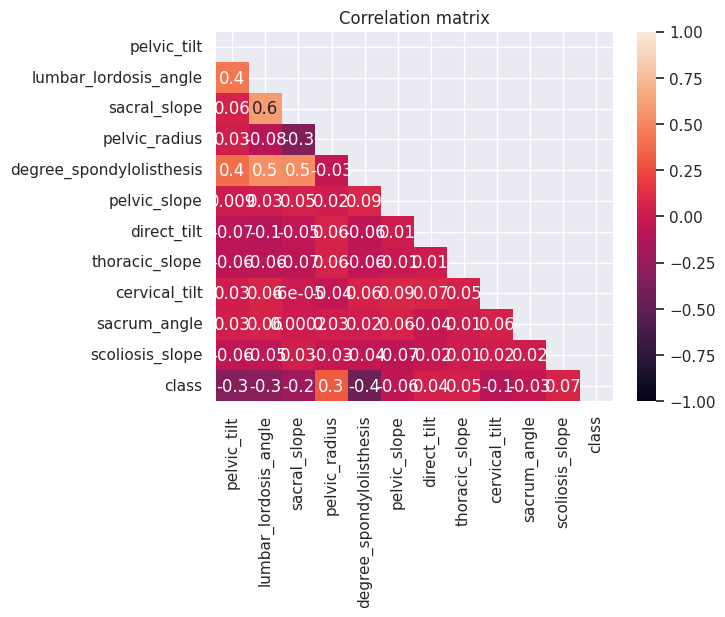

In [151]:
corr = dataset.corr()
matrix = np.triu(corr)
sns.heatmap(corr, vmax=1.0, vmin=-1.0, 
            fmt='.1g', annot=True, mask = matrix)

plt.title('Correlation matrix')
plt.show()

# **AutoML**

The data set consists of :


* Column 1  : Pelvic_incidence
* Column 2  : Pelvic tilt
* Column 3  : Lumbar_lordosis_angle
* Column 4  : Sacral_slope
* Column 5  : Pelvic_radius
* Column 6  : Degree_spondylolisthesis
* Column 7  : Pelvic_slope
* Column 8  : Direct_tilt
* Column 9  : Thoracic_slope
* Column 10 : Cervical_tilt
* Column 11 : Sacrum_angle
* Column 12 : Scoliosis_slope



In [152]:
data = pd.read_csv("https://raw.githubusercontent.com/paurush11/Assignment1_csv/main/income_evaluation.csv")

In [153]:
data.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [154]:
data.corr()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
age,1.000000,-0.076646,0.036527,0.077674,0.057775,0.068756
fnlwgt,-0.076646,1.000000,-0.043195,0.000432,-0.010252,-0.018768
education-num,0.036527,-0.043195,1.000000,0.122630,0.079923,0.148123
capital-gain,0.077674,0.000432,0.122630,1.000000,-0.031615,0.078409
capital-loss,0.057775,-0.010252,0.079923,-0.031615,1.000000,0.054256
hours-per-week,0.068756,-0.018768,0.148123,0.078409,0.054256,1.000000


## Performing One-Hot Encoding to make sure that income changes form a categorical variable to a numerical variable.

In [155]:
one_hot_encoded = pd.get_dummies(data, columns=[' income'])
df_encoded = pd.concat([data, one_hot_encoded], axis=1)

# Remove the original column since it's no longer needed
df_encoded.drop(' income', axis=1, inplace=True)
df_encoded.drop(' income_ >50K', axis=1, inplace=True)


print(df_encoded.describe())

                age        fnlwgt   education-num   capital-gain  \
count  32561.000000  3.256100e+04    32561.000000   32561.000000   
mean      38.581647  1.897784e+05       10.080679    1077.648844   
std       13.640433  1.055500e+05        2.572720    7385.292085   
min       17.000000  1.228500e+04        1.000000       0.000000   
25%       28.000000  1.178270e+05        9.000000       0.000000   
50%       37.000000  1.783560e+05       10.000000       0.000000   
75%       48.000000  2.370510e+05       12.000000       0.000000   
max       90.000000  1.484705e+06       16.000000   99999.000000   

        capital-loss   hours-per-week           age        fnlwgt  \
count   32561.000000     32561.000000  32561.000000  3.256100e+04   
mean       87.303830        40.437456     38.581647  1.897784e+05   
std       402.960219        12.347429     13.640433  1.055500e+05   
min         0.000000         1.000000     17.000000  1.228500e+04   
25%         0.000000        40.000000     

# **Multicollinearity**

In [156]:
import statsmodels.api as sm

model = sm.OLS(df_encoded[' income_ <=50K'], df_encoded[['age',' education-num', ' fnlwgt',' capital-gain', ' capital-loss',' hours-per-week']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:          income_ <=50K   R-squared (uncentered):                 -49.592
Model:                            OLS   Adj. R-squared (uncentered):            -49.602
Method:                 Least Squares   F-statistic:                             -5319.
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                        1.00
Time:                        19:56:53   Log-Likelihood:                         -21826.
No. Observations:               32561   AIC:                                  4.366e+04
Df Residuals:                   32555   BIC:                                  4.371e+04
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
age                 0.0018   8.62e-05     21.052      0.000       0.002       0.002
age                 0.0018   8.62e-05     21.052      0.000       0.002       0.002
 education-num      0.0111      0.000     26.627      0.000       0.010       0.012
 education-num      0.0111      0.000     26.627      0.000       0.010       0.012
 fnlwgt          4.618e-07   1.16e-08     39.860      0.000    4.39e-07    4.84e-07
 fnlwgt          4.618e-07   1.16e-08     39.860      0.000    4.39e-07    4.84e-07
 capital-gain   -7.197e-06   1.79e-07    -40.320      0.000   -7.55e-06   -6.85e-06
 capital-gain   -7.197e-06   1.79e-07    -40.320      0.000   -7.55e-06   -6.85e-06
 capital-loss    -8.32e-05   3.27e-06    -25.458      0.000   -8.96e-05   -7.68e-05
 capital-loss    -8.32e-05   3.27e-06    -25.458      0.000   -8.96e-05   -7.68e-05
 hours-per-week     0.0025   9.68e-05     25.733      0.000       0.002       0.003
 hours-per-week     0.0025   9.68e-05     25.733      0.000       0.002       0.003
==============================================================================
Omnibus:                     4549.596   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6567.873
Skew:                          -1.090   Prob(JB):                         0.00
Kurtosis:                       2.697   Cond. No.                     5.60e+20
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The smallest eigenvalue is 9.8e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

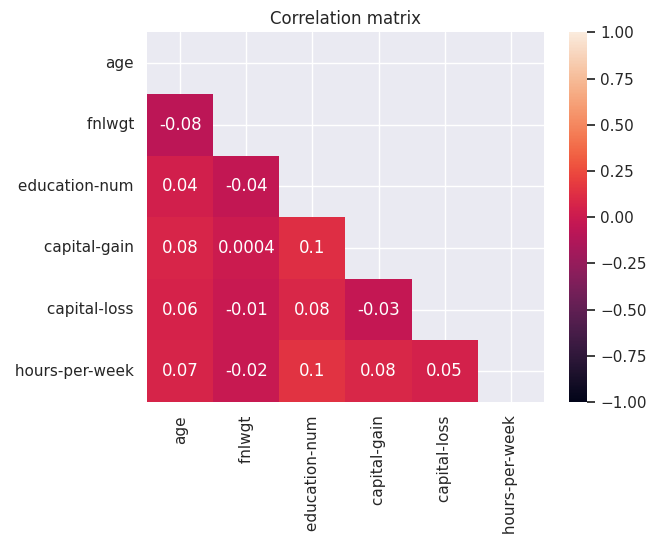

In [157]:
corr = data.corr()
matrix = np.triu(corr)
sns.heatmap(corr, vmax=1.0, vmin=-1.0, 
            fmt='.1g', annot=True, mask = matrix)

plt.title('Correlation matrix')
plt.show()

<Axes: >

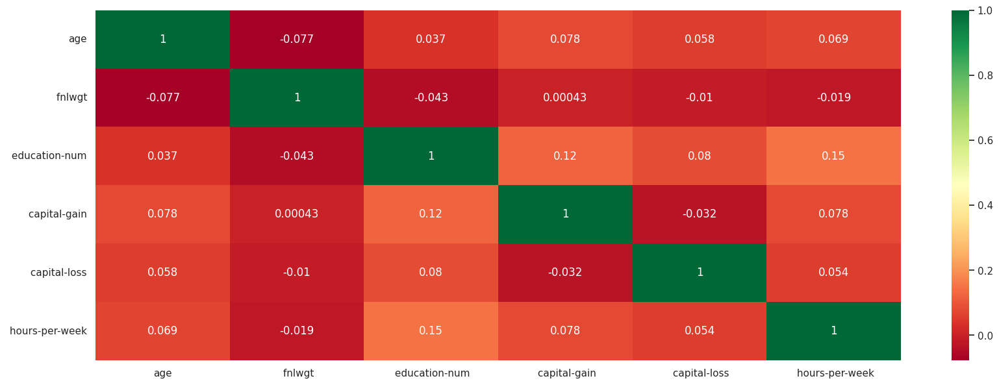

In [158]:
plt.figure(figsize=(20,7))
sns.heatmap(data.corr(), annot=True, cmap='RdYlGn')

In [159]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
predictors = [' education-num', 'age', ' hours-per-week', ' capital-gain', ' fnlwgt', ' capital-loss']
X = data[predictors].values

vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
for idx, val in enumerate(vif):
    print(f"VIF for {predictors[idx]}: {val}")

VIF for  education-num: 10.983289051593777
VIF for age: 7.246474858928762
VIF for  hours-per-week: 9.75809397330672
VIF for  capital-gain: 1.032986961692223
VIF for  fnlwgt: 3.6831436572454996
VIF for  capital-loss: 1.0568151412699898


# **H2O**

In [160]:
!pip3 install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [161]:
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,4 hours 35 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_wt7bmv
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.086 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [162]:
h20df = h2o.import_file("https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [163]:
h20df.describe(chunk_summary=True)

Rows:310
Cols:14

Chunk compression summary: 
chunk_type    chunk_name        count    count_percentage    size     size_percentage
------------  ----------------  -------  ------------------  -------  -----------------
CBS           Binary            1        7.14286             109  B   0.432522
C4S           4-Byte Fractions  6        42.8571             7.8 KB   31.5226
CStr          Strings           1        7.14286             1.8 KB   7.38066
C8D           64-bit Reals      6        42.8571             14.9 KB  60.6643

Frame distribution summary: 
                 size     number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  -------  ----------------  -----------------------------  ------------------
127.0.0.1:54321  24.6 KB  310               1                              14
mean             24.6 KB  310               1                              14
min              24.6 KB  310               1                              14
max              24.6 KB  310               1                              14
stddev           0  B     0                 0                              0
total            24.6 KB  310               1                              14

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,C14
type,real,real,real,real,real,real,real,real,real,real,real,real,enum,string
mins,26.14792141,-6.554948347,14.0,13.3669307,70.08257486,-11.05817866,0.003220264,7.027,7.0378,7.0306,-35.287375,7.0079,,NaN
mean,60.496652929516145,17.54282196797096,51.93092960345161,42.95383096141935,117.92065502380645,26.296694437867743,0.4729792534451614,21.32152612903226,13.064511290322582,11.93331674193548,-14.053139487096768,25.645980645161277,,NaN
maxs,129.8340406,49.4318636,125.7423855,121.4295656,163.0710405,418.5430821,0.998826684,36.7439,19.324,16.82108,6.972071,44.3412,,NaN
sigma,17.236520321708866,10.008330258206355,18.55406396276117,13.423102164839573,13.31737704490458,37.55902655487235,0.28578674082869,8.639423372673226,3.399712849977083,2.893265303802673,12.225582016950822,10.450558176100039,,NaN
zeros,0,0,0,0,0,0,0,0,0,0,0,0,,0
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,296
0,63.0278175,22.55258597,39.60911701,40.47523153,98.67291675,-0.254399986,0.744503464,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal,
1,39.05695098,10.06099147,25.01537822,28.99595951,114.4054254,4.564258645,0.415185678,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal,
2,68.83202098,22.21848205,50.09219357,46.61353893,105.9851355,-3.530317314,0.474889164,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal,Prediction is done by using binary classification.


In [164]:
h20df.head()

Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,C14
63.0278,22.5526,39.6091,40.4752,98.6729,-0.2544,0.744503,12.5661,14.5386,15.3047,-28.6585,43.5123,Abnormal,
39.057,10.061,25.0154,28.996,114.405,4.56426,0.415186,12.8874,17.5323,16.7849,-25.5306,16.1102,Abnormal,
68.832,22.2185,50.0922,46.6135,105.985,-3.53032,0.474889,26.8343,17.4861,16.659,-29.0319,19.2221,Abnormal,Prediction is done by using binary classification.
69.297,24.6529,44.3112,44.6441,101.868,11.2115,0.369345,23.5603,12.7074,11.4245,-30.4702,18.8329,Abnormal,
49.7129,9.65207,28.3174,40.0608,108.169,7.9185,0.54336,35.494,15.9546,8.87237,-16.3784,24.9171,Abnormal,
40.2502,13.9219,25.1249,26.3283,130.328,2.23065,0.789993,29.323,12.0036,10.4046,-1.51221,9.6548,Abnormal,Attribute1 = pelvic_incidence (numeric)
53.4329,15.8643,37.1659,37.5686,120.568,5.98855,0.19892,13.8514,10.7146,11.3783,-20.5104,25.9477,Abnormal,Attribute2 = pelvic_tilt (numeric)
45.3668,10.7556,29.0383,34.6111,117.27,-10.6759,0.131973,28.8165,7.7676,7.60961,-25.1115,26.3543,Abnormal,Attribute3 = lumbar_lordosis_angle (numeric)
43.7902,13.5338,42.6908,30.2564,125.003,13.289,0.190408,22.7085,11.4234,10.5919,-20.0201,40.0276,Abnormal,Attribute4 = sacral_slope (numeric)
36.6864,5.01088,41.9488,31.6755,84.2414,0.664437,0.3677,26.2011,8.738,14.9142,-1.7021,21.432,Abnormal,Attribute5 = pelvic_radius (numeric)


In [165]:
train, test = h20df.split_frame(ratios=[0.8], seed = 1)

In [166]:
# check the number of train set and test set
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()
drift_data["is_train"].table()

is_train,Count
0,61
1,249


In [167]:
x = list(set(train.col_names) - set(["Class_att"]))

In [168]:
def scatter_plot(data, x, y, max_points = 1000, fit = True):
    if(fit):
        lr = H2OGeneralizedLinearEstimator(family = "gaussian")
        lr.train(x=x, y=y, training_frame=data)
        coeff = lr.coef()
    df = data[[x,y]]
    runif = df[y].runif()
    df_subset = df[runif < float(max_points)/data.nrow]
    df_py = h2o.as_list(df_subset)
    
    if(fit): h2o.remove(lr._id)

    if(df_py[x].dtype == "object"):
        if interactive: df_py.boxplot(column = y, by = x)
    else:
        if interactive: df_py.plot(x = x, y = y, kind = "scatter")
    
    if(fit):
        x_min = min(df_py[x])
        x_max = max(df_py[x])
        y_min = coeff["Intercept"] + coeff[x]*x_min
        y_max = coeff["Intercept"] + coeff[x]*x_max
        plt.plot([x_min, x_max], [y_min, y_max], "k-")
    if interactive: plt.show()

In [169]:
from h2o.automl import H2OAutoML
aml = H2OAutoML(max_models =25,
                balance_classes=True,
		seed =1)

In [170]:
aml.train(training_frame = train, y = 'Class_att')

AutoML progress: |
19:57:05.316: _train param, Dropping bad and constant columns: [C14, is_train]

█
19:57:08.883: _train param, Dropping bad and constant columns: [C14, is_train]


19:57:09.898: _train param, Dropping bad and constant columns: [C14, is_train]
19:57:09.964: GBM_1_AutoML_2_20230409_195705 [GBM def_5] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for GBM model: GBM_1_AutoML_2_20230409_195705.  Details: ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have 

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [171]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_2_20230409_195705,0.924247,0.316459,0.842523,0.137452,0.316696,0.100296
GLM_1_AutoML_2_20230409_195705,0.922471,0.318875,0.81037,0.158494,0.31903,0.10178
GBM_grid_1_AutoML_2_20230409_195705_model_2,0.917375,0.345314,0.839473,0.155869,0.328047,0.107615
StackedEnsemble_AllModels_1_AutoML_2_20230409_195705,0.910734,0.341507,0.808727,0.154595,0.330412,0.109172
XGBoost_grid_1_AutoML_2_20230409_195705_model_1,0.905174,0.350625,0.837468,0.174324,0.332388,0.110482
GBM_4_AutoML_2_20230409_195705,0.905097,0.360012,0.824937,0.167297,0.336632,0.113321
XGBoost_3_AutoML_2_20230409_195705,0.903398,0.377717,0.823738,0.174865,0.3475,0.120756
GBM_3_AutoML_2_20230409_195705,0.902934,0.369506,0.819094,0.179266,0.343892,0.118262
GBM_2_AutoML_2_20230409_195705,0.902703,0.364788,0.798747,0.179035,0.336184,0.11302
GBM_grid_1_AutoML_2_20230409_195705_model_3,0.899846,0.371801,0.81438,0.175097,0.344029,0.118356


In [172]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_1_AutoML_2_20230409_195705


Model Summary for Stacked Ensemble: 
key                                        value
-----------------------------------------  ----------------
Stacking strategy                          cross_validation
Number of base models (used / total)       4/6
# GBM base models (used / total)           1/1
# XGBoost base models (used / total)       0/1
# GLM base models (used / total)           1/1
# DRF base models (used / total)           1/2
# DeepLearning base models (used / total)  1/1
Metalearner algorithm                      GLM
Metalearner fold assignment scheme         Random
Metalearner nfolds                         5
Metalearner fold_column
Custom metalearner hyperparameters         None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.037063298112532596
RMSE: 0.19251830591539235
LogLoss: 0.1407242724493669
AUC: 0.99420849

In [173]:
import matplotlib.pyplot as plt
leaderboard = aml.leaderboard
print(leaderboard)

model_id                                                      auc    logloss     aucpr    mean_per_class_error      rmse       mse
StackedEnsemble_BestOfFamily_1_AutoML_2_20230409_195705  0.924247   0.316459  0.842523                0.137452  0.316696  0.100296
GLM_1_AutoML_2_20230409_195705                           0.922471   0.318875  0.81037                 0.158494  0.31903   0.10178
GBM_grid_1_AutoML_2_20230409_195705_model_2              0.917375   0.345314  0.839473                0.155869  0.328047  0.107615
StackedEnsemble_AllModels_1_AutoML_2_20230409_195705     0.910734   0.341507  0.808727                0.154595  0.330412  0.109172
XGBoost_grid_1_AutoML_2_20230409_195705_model_1          0.905174   0.350625  0.837468                0.174324  0.332388  0.110482
GBM_4_AutoML_2_20230409_195705                           0.905097   0.360012  0.824937                0.167297  0.336632  0.113321
XGBoost_3_AutoML_2_20230409_195705                       0.903398   0.377717  0.8237

In [174]:
leaderboard = aml.leaderboard.as_data_frame()
ensemble_perf = aml.leader.model_performance(test_data=test)

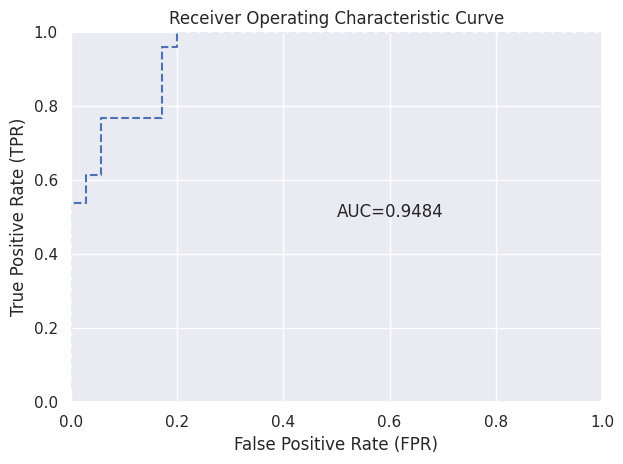

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.02857142857142857,
  0.02857142857142857,
  0.02857142857142857,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.08571428571428572,
  0.11428571428571428,
  0.14285714285714285,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.2,
  0.2,
  0.22857142857142856,
  0.2571428571428571,
  0.2857142857142857,
  0.3142857142857143,
  0.34285714285714286,
  0.37142857142857144,
  0.4,
  0.42857142857142855,
  0.45714285714285713,
  0.4857142857142857,
  0.5142857142857142,
  0.5428571428571428,
  0.5714285714285714,
  0.6,
  0.6285714285714286,
  0.6571428571428571,
  0.6857142857142857,
  0.7142857142857143,
  0.7428571428571429,
  0.7714285714285715,
  0.8,
  0.8285714285714286,
  0.8571428571428571,
  0.8857142857142857,
  0.91428

In [175]:
ensemble_perf.plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_2_20230409_195705

,Abnormal,Normal,Error,Rate
Abnormal,174.0,1.0,0.0057,(1.0/175.0)
Normal,6.0,68.0,0.0811,(6.0/74.0)
Total,180.0,69.0,0.0281,(7.0/249.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

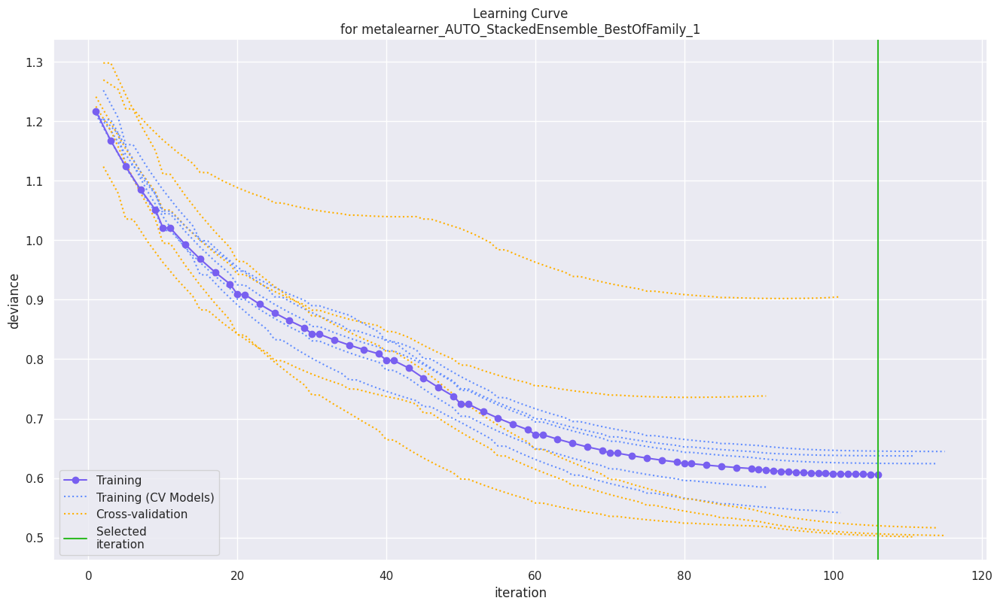

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

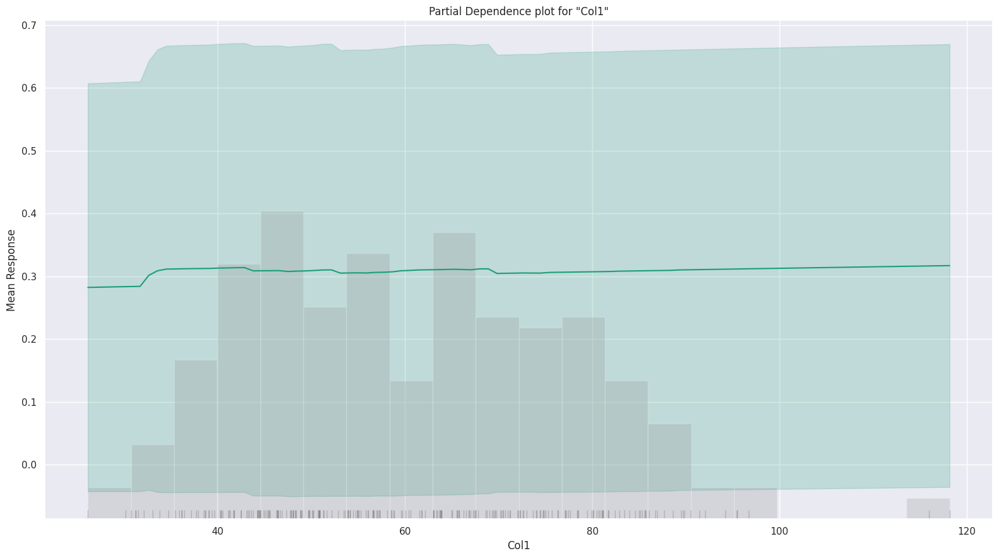

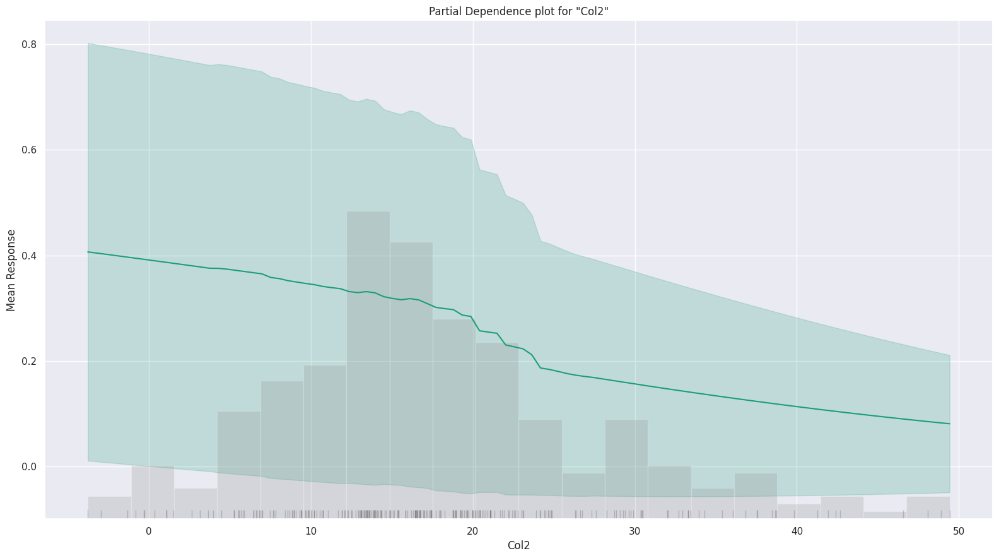

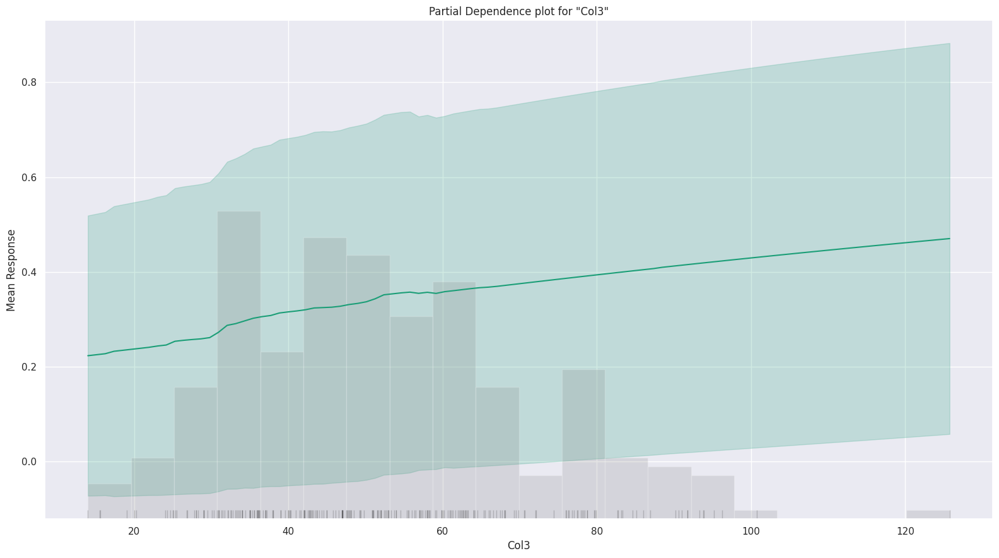

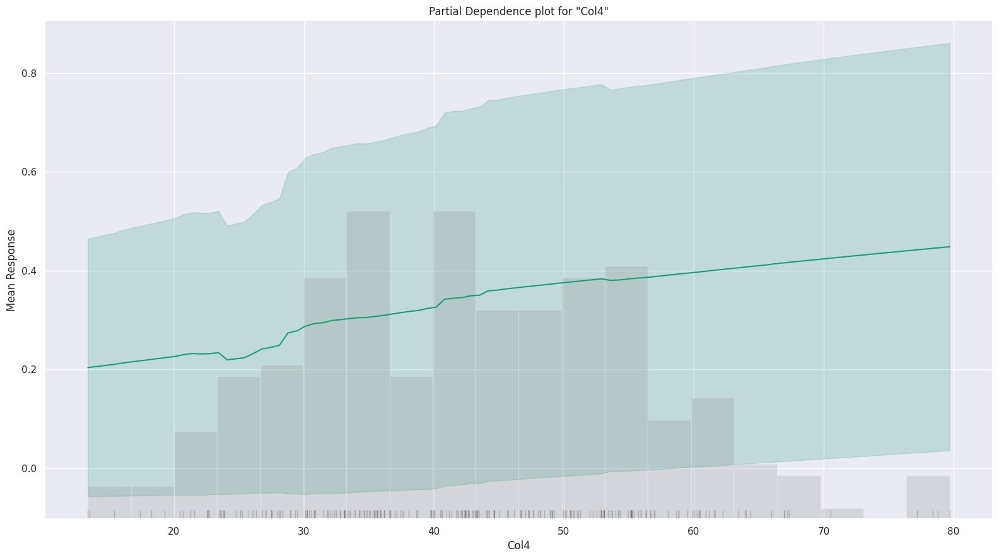

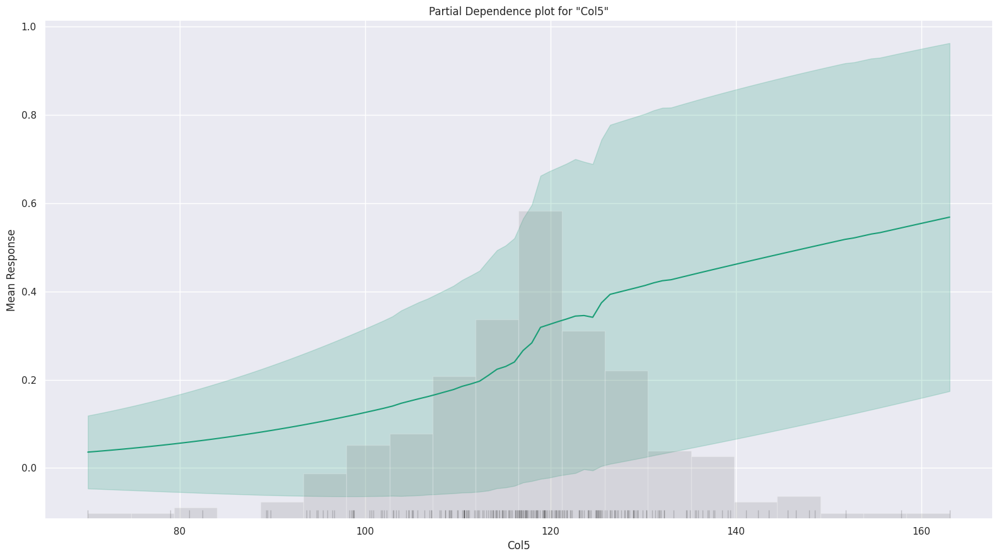

...

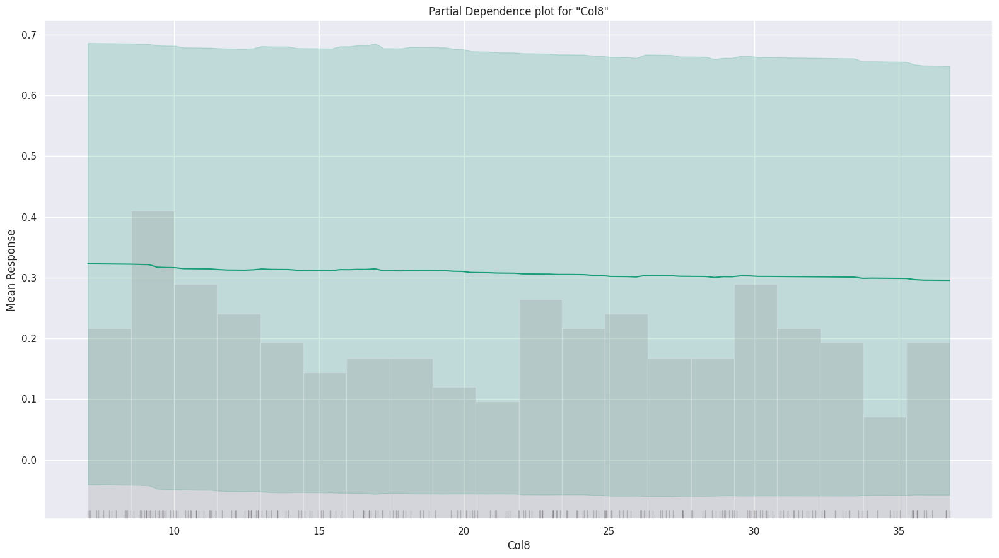

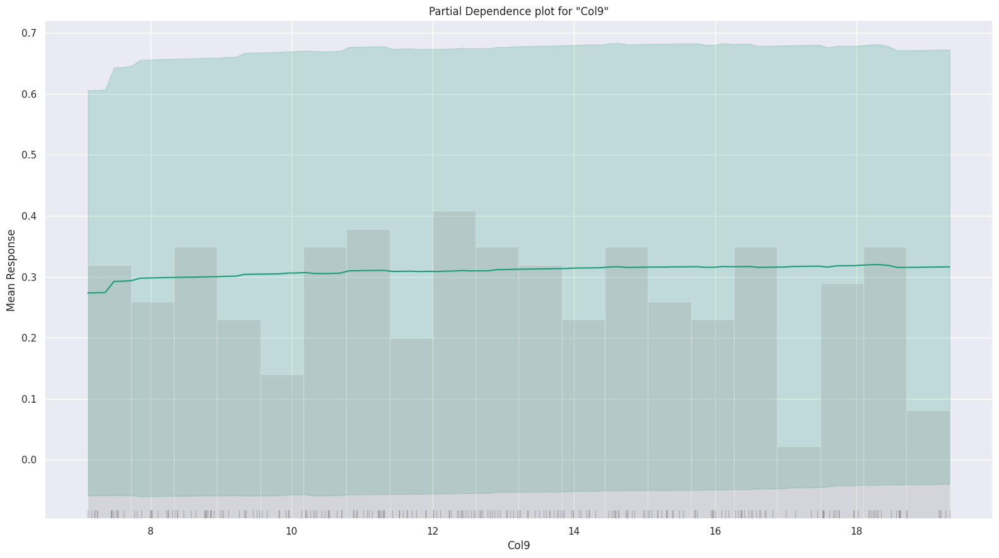

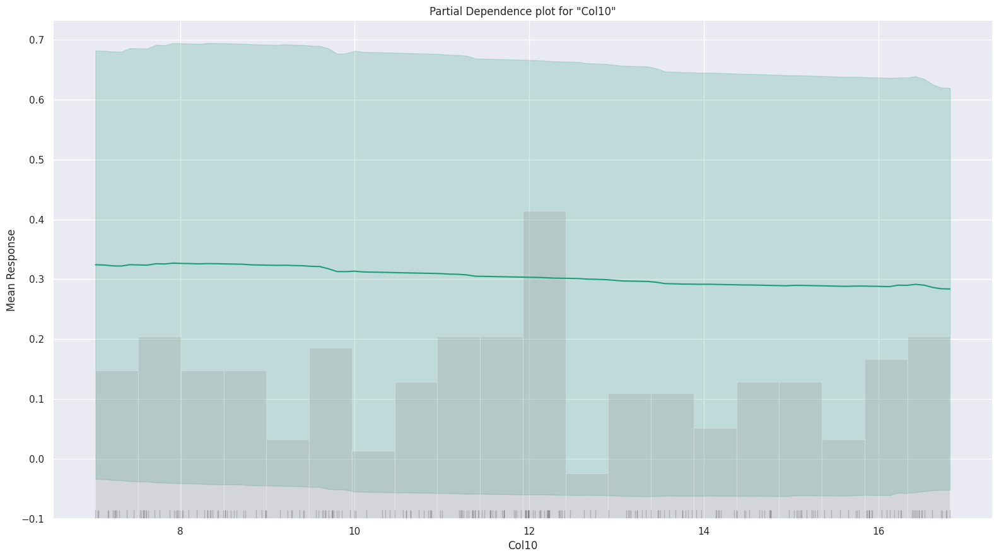

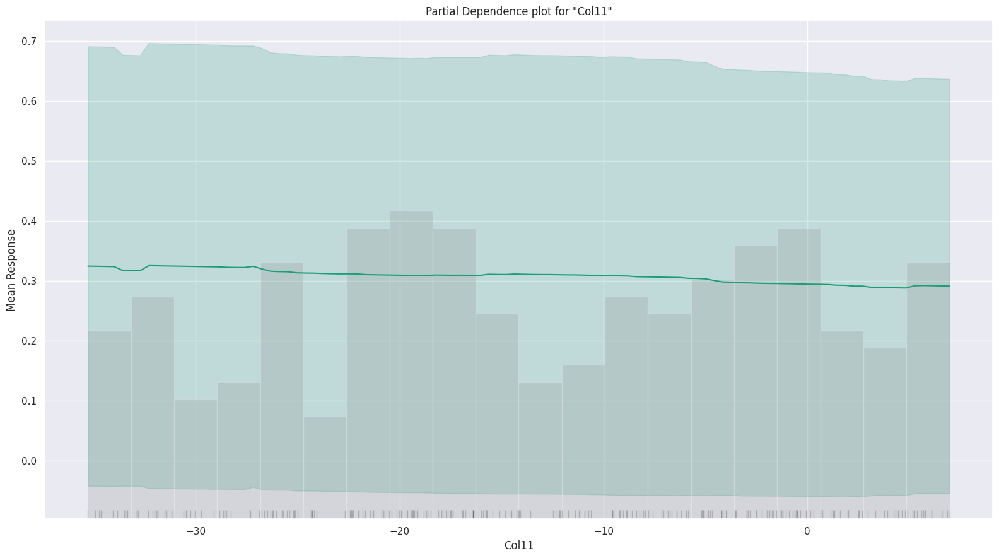

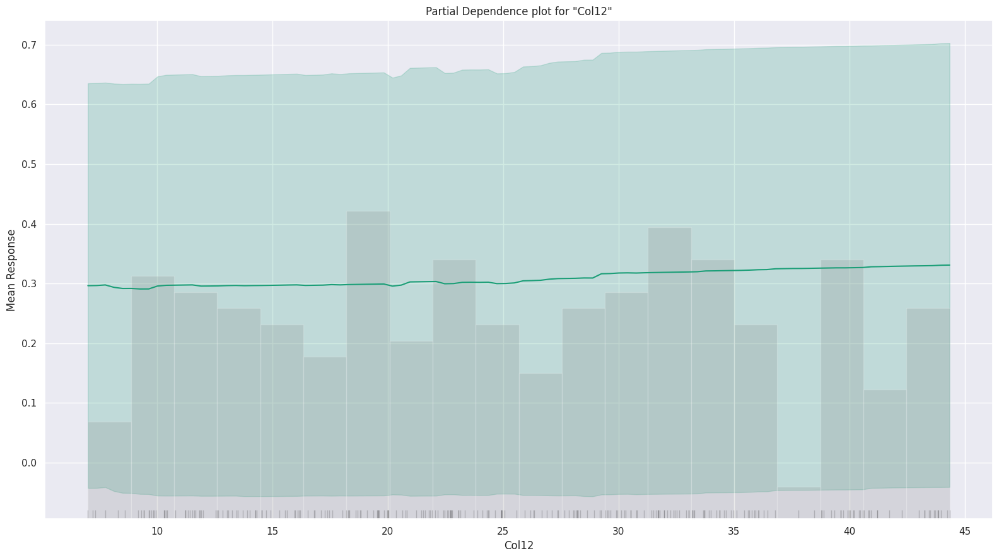

In [176]:
fi = aml.leader.explain(train)

In [177]:
stacked_ensemble = h2o.get_model(aml.leaderboard.as_data_frame().model_id[0])

perf = stacked_ensemble.model_performance()
stacked_ensemble.download_mojo(get_genmodel_jar=True)
stacked_ensemble.show()


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

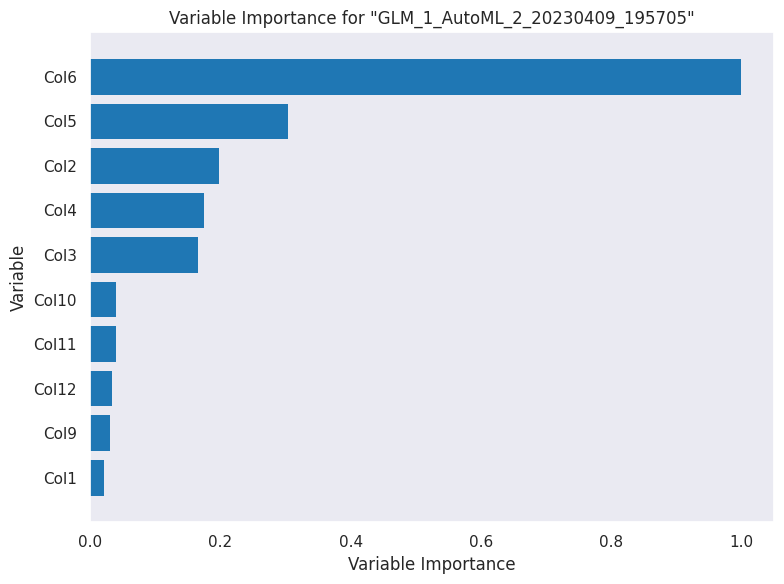

In [178]:
explain_model = aml.explain(frame = test, figsize = (8,6),include_explanations=['varimp'])

The R-squared values (0.756 for uncentered and 0.746 for adjusted).
Therefore, a positive R-squared value by itself does not imply statistical significance. It is possible to have a positive R-squared value in a regression model that is not statistically significant. Conversely, it is also possible to have a statistically significant regression model with a low R-squared value.

# Model Interpretability 

In [179]:
pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [180]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
import shap
import time
from sklearn.metrics import accuracy_score

In [181]:
data = pd.read_csv("https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv")

In [182]:
data.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,Unnamed: 13
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal,NaN
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal,NaN
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal,Prediction is done by using binary classificat...
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,-30.470246,18.8329,Abnormal,NaN
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,-16.378376,24.9171,Abnormal,NaN


In [183]:
data.describe()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12
count,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000,310.000000
mean,60.496653,17.542822,51.930930,42.953831,117.920655,26.296694,0.472979,21.321526,13.064511,11.933317,-14.053139,25.645981
std,17.236520,10.008330,18.554064,13.423102,13.317377,37.559027,0.285787,8.639423,3.399713,2.893265,12.225582,10.450558
min,26.147921,-6.554948,14.000000,13.366931,70.082575,-11.058179,0.003220,7.027000,7.037800,7.030600,-35.287375,7.007900
25%,46.430294,10.667069,37.000000,33.347122,110.709196,1.603727,0.224367,13.054400,10.417800,9.541140,-24.289522,17.189075
50%,58.691038,16.357689,49.562398,42.404912,118.268178,11.767934,0.475989,21.907150,12.938450,11.953835,-14.622856,24.931950
75%,72.877696,22.120395,63.000000,52.695888,125.467674,41.287352,0.704846,28.954075,15.889525,14.371810,-3.497094,33.979600
max,129.834041,49.431864,125.742385,121.429566,163.071041,418.543082,0.998827,36.743900,19.324000,16.821080,6.972071,44.341200


In [184]:
data.corr()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12
Col1,1.000000,0.629199,0.717282,0.814960,-0.247467,0.638743,0.043290,-0.078411,-0.089740,0.016750,0.019240,-0.007251
Col2,0.629199,1.000000,0.432764,0.062345,0.032668,0.397862,0.008852,-0.072119,-0.063394,0.028931,0.032859,-0.056550
Col3,0.717282,0.432764,1.000000,0.598387,-0.080344,0.533667,0.029486,-0.112939,-0.063582,0.063875,0.057199,-0.049054
Col4,0.814960,0.062345,0.598387,1.000000,-0.342128,0.523557,0.048988,-0.046914,-0.067968,-0.000063,0.000207,0.032853
Col5,-0.247467,0.032668,-0.080344,-0.342128,1.000000,-0.026065,0.015767,0.063433,0.060477,-0.039800,0.029738,-0.030145
Col6,0.638743,0.397862,0.533667,0.523557,-0.026065,1.000000,0.085925,-0.063812,-0.057286,0.056576,0.023021,-0.041023
Col7,0.043290,0.008852,0.029486,0.048988,0.015767,0.085925,1.000000,0.012694,-0.011770,0.088017,0.060743,-0.073893
Col8,-0.078411,-0.072119,-0.112939,-0.046914,0.063433,-0.063812,0.012694,1.000000,0.009887,0.072738,-0.037428,-0.024021
Col9,-0.089740,-0.063394,-0.063582,-0.067968,0.060477,-0.057286,-0.011770,0.009887,1.000000,0.052451,0.011354,0.009541
Col10,0.016750,0.028931,0.063875,-0.000063,-0.039800,0.056576,0.088017,0.072738,0.052451,1.000000,0.057451,0.021243


# LOGISTIC REGRESSION

To fit a linear model to this dataset, we need to first encode the categorical variables using one-hot encoding or dummy variables. Once we have done that, we can use logistic regression to predict the probability of an individual having an income of over 50k based on the independent variables.

In [185]:
one_hot_encoded = pd.get_dummies(data, columns=['Class_att'])
df_encoded = pd.concat([data, one_hot_encoded], axis=1)

# Remove the original column since it's no longer needed
df_encoded.drop('Class_att', axis=1, inplace=True)

print(df_encoded)
print(df_encoded.describe())

          Col1       Col2       Col3       Col4        Col5       Col6  \
0    63.027817  22.552586  39.609117  40.475232   98.672917  -0.254400   
1    39.056951  10.060991  25.015378  28.995960  114.405425   4.564259   
2    68.832021  22.218482  50.092194  46.613539  105.985135  -3.530317   
3    69.297008  24.652878  44.311238  44.644130  101.868495  11.211523   
4    49.712859   9.652075  28.317406  40.060784  108.168725   7.918501   
..         ...        ...        ...        ...         ...        ...   
305  47.903565  13.616688  36.000000  34.286877  117.449062  -4.245395   
306  53.936748  20.721496  29.220534  33.215251  114.365845  -0.421010   
307  61.446597  22.694968  46.170347  38.751628  125.670725  -2.707880   
308  45.252792   8.693157  41.583126  36.559635  118.545842   0.214750   
309  33.841641   5.073991  36.641233  28.767649  123.945244  -0.199249   

         Col7     Col8     Col9     Col10  ...       Col6      Col7     Col8  \
0    0.744503  12.5661  14.5386

In [186]:
df_treat = pd.get_dummies(data)
df_treat.dtypes.value_counts()
df_treat = df_treat.rename(columns=({'Class_att_Abnormal':'Abnormal','Class_att_Normal':'Normal'}))
df_treat.head(10)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,...,Unnamed: 13_ Attribute8= Direct_tilt(numeric),Unnamed: 13_ Attribute9= thoracic_slope(numeric),"Unnamed: 13_Attribute class {Abnormal, Normal}",Unnamed: 13_Attribute1 = pelvic_incidence (numeric),Unnamed: 13_Attribute2 = pelvic_tilt (numeric),Unnamed: 13_Attribute3 = lumbar_lordosis_angle (numeric),Unnamed: 13_Attribute4 = sacral_slope (numeric),Unnamed: 13_Attribute5 = pelvic_radius (numeric),Unnamed: 13_Attribute6 = degree_spondylolisthesis (numeric),Unnamed: 13_Prediction is done by using binary classification.
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,...,0,0,0,0,0,0,0,0,0,0
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,...,0,0,0,0,0,0,0,0,0,0
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,...,0,0,0,0,0,0,0,0,0,1
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,...,0,0,0,0,0,0,0,0,0,0
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,...,0,0,0,0,0,0,0,0,0,0
5,40.250200,13.921907,25.124950,26.328293,130.327871,2.230652,0.789993,29.3230,12.0036,10.40462,...,0,0,0,1,0,0,0,0,0,0
6,53.432928,15.864336,37.165934,37.568592,120.567523,5.988551,0.198920,13.8514,10.7146,11.37832,...,0,0,0,0,1,0,0,0,0,0
7,45.366754,10.755611,29.038349,34.611142,117.270067,-10.675871,0.131973,28.8165,7.7676,7.60961,...,0,0,0,0,0,1,0,0,0,0
8,43.790190,13.533753,42.690814,30.256437,125.002893,13.289018,0.190408,22.7085,11.4234,10.59188,...,0,0,0,0,0,0,1,0,0,0
9,36.686353,5.010884,41.948751,31.675469,84.241415,0.664437,0.367700,26.2011,8.7380,14.91416,...,0,0,0,0,0,0,0,1,0,0


In [187]:
df_treat

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,...,Unnamed: 13_ Attribute8= Direct_tilt(numeric),Unnamed: 13_ Attribute9= thoracic_slope(numeric),"Unnamed: 13_Attribute class {Abnormal, Normal}",Unnamed: 13_Attribute1 = pelvic_incidence (numeric),Unnamed: 13_Attribute2 = pelvic_tilt (numeric),Unnamed: 13_Attribute3 = lumbar_lordosis_angle (numeric),Unnamed: 13_Attribute4 = sacral_slope (numeric),Unnamed: 13_Attribute5 = pelvic_radius (numeric),Unnamed: 13_Attribute6 = degree_spondylolisthesis (numeric),Unnamed: 13_Prediction is done by using binary classification.
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,...,0,0,0,0,0,0,0,0,0,0
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,...,0,0,0,0,0,0,0,0,0,0
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,...,0,0,0,0,0,0,0,0,0,1
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,...,0,0,0,0,0,0,0,0,0,0
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,47.903565,13.616688,36.000000,34.286877,117.449062,-4.245395,0.129744,7.8433,14.7484,8.51707,...,0,0,0,0,0,0,0,0,0,0
306,53.936748,20.721496,29.220534,33.215251,114.365845,-0.421010,0.047913,19.1986,18.1972,7.08745,...,0,0,0,0,0,0,0,0,0,0
307,61.446597,22.694968,46.170347,38.751628,125.670725,-2.707880,0.081070,16.2059,13.5565,8.89572,...,0,0,0,0,0,0,0,0,0,0
308,45.252792,8.693157,41.583126,36.559635,118.545842,0.214750,0.159251,14.7334,16.0928,9.75922,...,0,0,0,0,0,0,0,0,0,0


In [188]:
temp= [df_treat['Abnormal'],df_treat['Normal']]
y= pd.DataFrame(temp)
y= y.transpose()
x = df_treat.drop(columns=['Abnormal','Normal'])

In [189]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size = 0.20,random_state = 42)

In [190]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn import metrics

model_LR= LogisticRegression()

In [191]:
model_LR.fit(x_train,y_train['Abnormal'])

LogisticRegression()

In [192]:
y_prob = model_LR.predict_proba(x_test)[:,1] # This will give you positive class prediction probabilities  
y_pred = np.where(y_prob > 0.5, 1, 0) # This will threshold the probabilities to give class predictions.
model_LR.score(x_test, y_pred)


from sklearn.model_selection import cross_val_score
from sklearn import metrics

confusion_matrix=metrics.confusion_matrix(y_test['Abnormal'],y_pred)
confusion_matrix
     

array([[12,  6],
       [ 7, 37]])

ROC AUC SCORE

In [193]:
auc_roc=metrics.roc_auc_score(y_test['Abnormal'],y_pred)
auc_roc

0.7537878787878788

In [194]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test['Abnormal'], y_prob)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc
     

0.9002525252525252

**Plotting the ROC curve in order to evaluate the classification**

Text(0.5, 0, 'False Positive Rate')

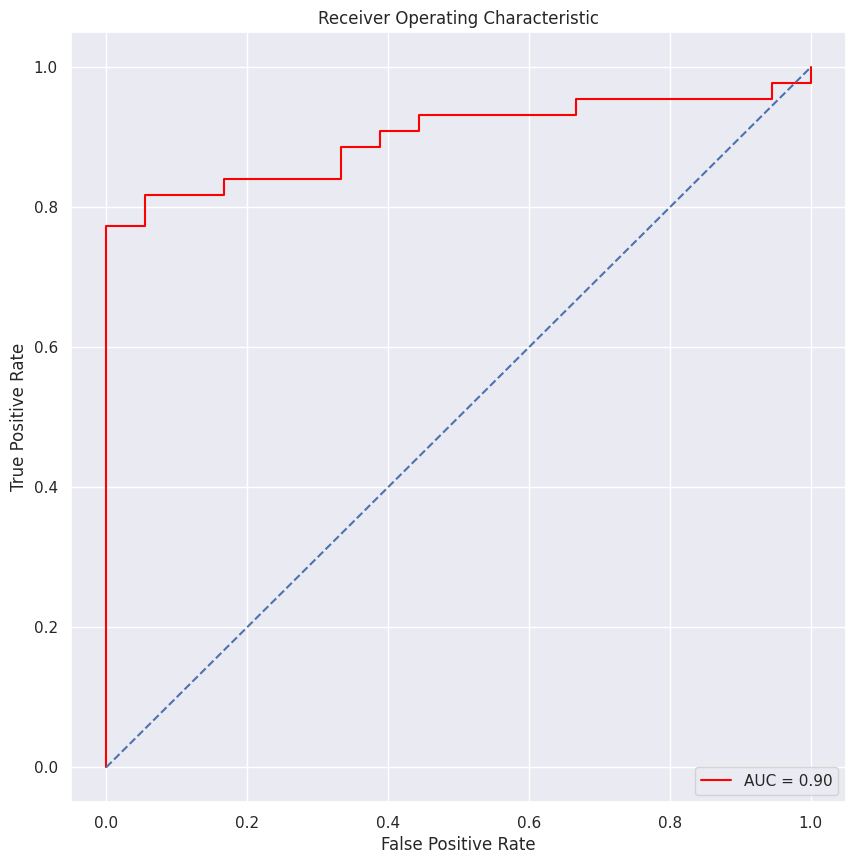

In [195]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate,true_positive_rate, color='red',label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],linestyle='--')
plt.axis('tight')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

In [196]:
one_hot_encoded = pd.get_dummies(data, columns=['Class_att'])
df_encoded = pd.concat([data, one_hot_encoded], axis=1)

# Remove the original column since it's no longer needed
df_encoded.drop('Class_att', axis=1, inplace=True)

print(df_encoded)
print(df_encoded.describe())

          Col1       Col2       Col3       Col4        Col5       Col6  \
0    63.027817  22.552586  39.609117  40.475232   98.672917  -0.254400   
1    39.056951  10.060991  25.015378  28.995960  114.405425   4.564259   
2    68.832021  22.218482  50.092194  46.613539  105.985135  -3.530317   
3    69.297008  24.652878  44.311238  44.644130  101.868495  11.211523   
4    49.712859   9.652075  28.317406  40.060784  108.168725   7.918501   
..         ...        ...        ...        ...         ...        ...   
305  47.903565  13.616688  36.000000  34.286877  117.449062  -4.245395   
306  53.936748  20.721496  29.220534  33.215251  114.365845  -0.421010   
307  61.446597  22.694968  46.170347  38.751628  125.670725  -2.707880   
308  45.252792   8.693157  41.583126  36.559635  118.545842   0.214750   
309  33.841641   5.073991  36.641233  28.767649  123.945244  -0.199249   

         Col7     Col8     Col9     Col10  ...       Col6      Col7     Col8  \
0    0.744503  12.5661  14.5386

In [197]:
df_treat = pd.get_dummies(data)
df_treat.dtypes.value_counts()
df_treat = df_treat.rename(columns=({'Class_att_Abnormal':'Abnormal','Class_att_Normal':'Normal'}))
df_treat.head(10)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,...,Unnamed: 13_ Attribute8= Direct_tilt(numeric),Unnamed: 13_ Attribute9= thoracic_slope(numeric),"Unnamed: 13_Attribute class {Abnormal, Normal}",Unnamed: 13_Attribute1 = pelvic_incidence (numeric),Unnamed: 13_Attribute2 = pelvic_tilt (numeric),Unnamed: 13_Attribute3 = lumbar_lordosis_angle (numeric),Unnamed: 13_Attribute4 = sacral_slope (numeric),Unnamed: 13_Attribute5 = pelvic_radius (numeric),Unnamed: 13_Attribute6 = degree_spondylolisthesis (numeric),Unnamed: 13_Prediction is done by using binary classification.
0,63.027817,22.552586,39.609117,40.475232,98.672917,-0.254400,0.744503,12.5661,14.5386,15.30468,...,0,0,0,0,0,0,0,0,0,0
1,39.056951,10.060991,25.015378,28.995960,114.405425,4.564259,0.415186,12.8874,17.5323,16.78486,...,0,0,0,0,0,0,0,0,0,0
2,68.832021,22.218482,50.092194,46.613539,105.985135,-3.530317,0.474889,26.8343,17.4861,16.65897,...,0,0,0,0,0,0,0,0,0,1
3,69.297008,24.652878,44.311238,44.644130,101.868495,11.211523,0.369345,23.5603,12.7074,11.42447,...,0,0,0,0,0,0,0,0,0,0
4,49.712859,9.652075,28.317406,40.060784,108.168725,7.918501,0.543360,35.4940,15.9546,8.87237,...,0,0,0,0,0,0,0,0,0,0
5,40.250200,13.921907,25.124950,26.328293,130.327871,2.230652,0.789993,29.3230,12.0036,10.40462,...,0,0,0,1,0,0,0,0,0,0
6,53.432928,15.864336,37.165934,37.568592,120.567523,5.988551,0.198920,13.8514,10.7146,11.37832,...,0,0,0,0,1,0,0,0,0,0
7,45.366754,10.755611,29.038349,34.611142,117.270067,-10.675871,0.131973,28.8165,7.7676,7.60961,...,0,0,0,0,0,1,0,0,0,0
8,43.790190,13.533753,42.690814,30.256437,125.002893,13.289018,0.190408,22.7085,11.4234,10.59188,...,0,0,0,0,0,0,1,0,0,0
9,36.686353,5.010884,41.948751,31.675469,84.241415,0.664437,0.367700,26.2011,8.7380,14.91416,...,0,0,0,0,0,0,0,1,0,0


In [198]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

**Creating scaler and new standardized train and test data frames.**

In [199]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train_numeral = scaler.fit_transform(X_train.select_dtypes(['float', 'int64']))
X_train_s = pd.concat([pd.DataFrame(X_train_numeral, index=X_train.index, columns=X_train.columns[:12]), 
                       X_train.iloc[:, 12:]], axis=1)

X_test_numeral = scaler.transform(X_test.select_dtypes(['float', 'int64']))
X_test_s = pd.concat([pd.DataFrame(X_test_numeral, index=X_test.index, columns=X_test.columns[:12]),
                      X_test.iloc[:, 12:]], axis=1)

In [200]:
def algoritm_score_list(show_processing=False, standardized=False):
    scores_list = []

    for algorithm in algorithms:
        if show_processing:
            print('processing ' + str(algorithm) + ' algorithm...')

        if standardized:
            X_tn = X_train_s
            X_tt = X_test_s
        else:
            X_tn = X_train
            X_tt = X_test
            
        A = algorithm.fit(X_tn, y_train)
        y_predict = A.predict(X_tt)
        accuracy = accuracy_score(y_test,y_predict)

        scores_list.append([A, accuracy, standardized])
        
    print('all predictions finished')
    return scores_list
     

In [201]:
from sklearn.tree import DecisionTreeClassifier
algorithms = [DecisionTreeClassifier()]

In [202]:
default_alg = algoritm_score_list()

all predictions finished


In [203]:
default_alg_s = algoritm_score_list(standardized=True)

all predictions finished


In [204]:
df_alg = pd.DataFrame(default_alg, columns=['algorithm', 'accuracy', 'standardized'])
df_alg = pd.concat([df_alg, 
                    pd.DataFrame(default_alg_s, columns=['algorithm', 'accuracy', 'standardized'])], 
                   axis=0, 
                   ignore_index=True)
df_alg.sort_values(by='accuracy', ascending=False)

,algorithm,accuracy,standardized
0,DecisionTreeClassifier(),0.784946,False
1,DecisionTreeClassifier(),0.752688,True


As for DecisionTreeClassifier, unstandardized data doesn't influence accuracy.


# Tuning DecisionTree
While this is one of my first times using DecisionTreeClassifier and I'm not sure how to fix all parameters I will try to maximaize accuracy by changing max_depth and min_samples_leaf parameters. I will also check the accuracy of two criterion: gini and entropy.

In [205]:
depth = default_alg[0][0].get_depth()

algorithms = []
for i in range(1, depth+1):
    algorithms.append(DecisionTreeClassifier(max_depth=i))
score_list = algoritm_score_list()

all predictions finished


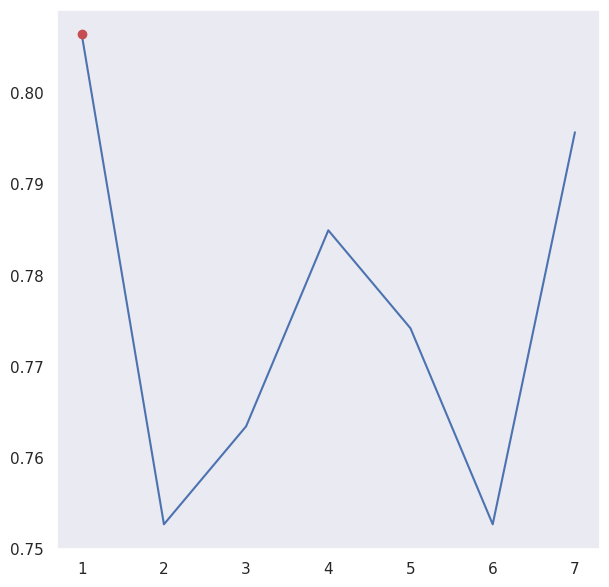

In [206]:
scores = list(map(lambda a: a[1], score_list))
fig = plt.figure(figsize=(7, 7))
plt.grid()
sns.lineplot(x=range(1, depth+1), y=scores)
plt.plot(scores.index(max(scores)) + 1, max(scores), "or")

In [207]:
print('The best algorithm: DecisionTreeClassifier(max_depth={}), its accuracy: {}'.format(scores.index(max(scores)) + 1, round(max(scores))))

The best algorithm: DecisionTreeClassifier(max_depth=1), its accuracy: 1


The graph shows that default min_samples_leaf overfitted the algorithm. A proper min_samples_leaf that increases accuracy should be bigger than 25 and smaller than 170 (it really depends on train and test spliting).


# max_depth and min_samples_leaf

In [208]:
# min_samples_leaf in already created DT
default_alg[0][0].get_params()['min_samples_leaf']

1

In [209]:
algorithms = []
for i in range(1, 202, 5):
    algorithms.append(DecisionTreeClassifier(min_samples_leaf=i))
score_list = algoritm_score_list()

all predictions finished


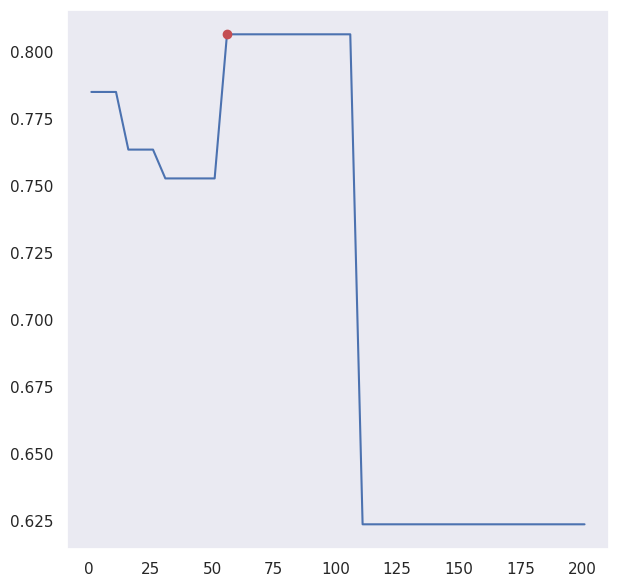

In [210]:
scores = list(map(lambda a: a[1], score_list))
fig = plt.figure(figsize=(7, 7))
plt.grid()
sns.lineplot(x=range(1, 202, 5), y=scores)
plt.plot(scores.index(max(scores))*5 + 1, max(scores), "or")

In [211]:
print('The best algorithm: DecisionTreeClassifier(min_samples_leaf={}), its accuracy: {}'.format(scores.index(max(scores))*5 + 1, round(max(scores), 3)))

The best algorithm: DecisionTreeClassifier(min_samples_leaf=56), its accuracy: 0.806


In [212]:
algorithms = []
for i in range(4, 30, 3):
    for j in range(45, 86, 5):
         algorithms.append(DecisionTreeClassifier(max_depth=i, min_samples_leaf=j))
score_list = algoritm_score_list() 

all predictions finished


In [213]:
max_depth = list(map(lambda a: a[0].get_params()['max_depth'], score_list))
min_samples_leaf = list(map(lambda a: a[0].get_params()['min_samples_leaf'], score_list))
scores = list(map(lambda a: a[1], score_list))

df = pd.DataFrame(np.array([max_depth, min_samples_leaf, scores]).T, 
                  columns=['max_depth', 'min_s_l', 'scores'])

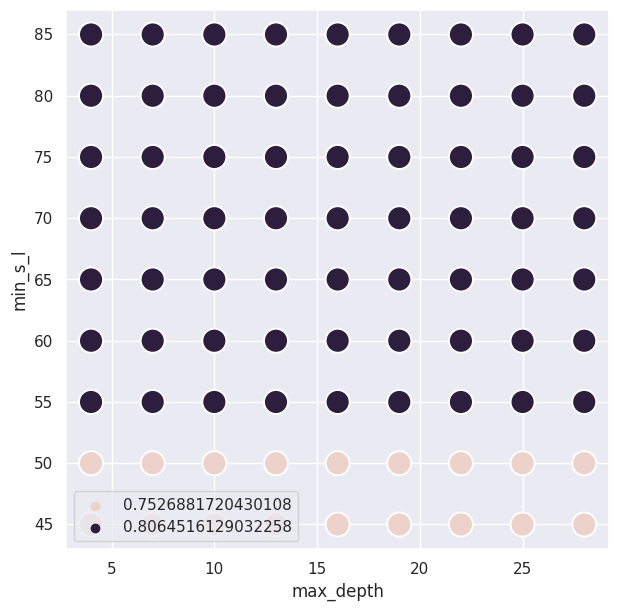

In [214]:
fig = plt.figure(figsize=(7, 7))
sns.scatterplot(x=df['max_depth'], y=df['min_s_l'], hue=df['scores'], s=300)
plt.legend(loc='lower left')

In [215]:
best = scores.index(max(scores))
m_d = max_depth[best]
m_s_l = min_samples_leaf[best]
print('The best algorithm: DecisionTreeClassifier(max_depth={}, min_samples_leaf={}), its accuracy: {}'.format(m_d, m_s_l, round(max(scores), 3)))

The best algorithm: DecisionTreeClassifier(max_depth=4, min_samples_leaf=55), its accuracy: 0.806


## Criterion

In [216]:
algorithms = [DecisionTreeClassifier(criterion='gini'), DecisionTreeClassifier(criterion='entropy')]
score_list = algoritm_score_list()   
print('criterion: gini, score: {}.'.format(str(round(score_list[0][1], 3))))
print('criterion: entropy, score: {}.'.format(str(round(score_list[1][1], 3))))

all predictions finished
criterion: gini, score: 0.753.
criterion: entropy, score: 0.785.


My criterion comparison showed that there is no huge difference between gini and entropy in this particular dataset. Consequently, I use the default criterion: gini.

# Algorithms comparison

In [217]:
algorithms = [DecisionTreeClassifier(criterion='gini', max_depth=9), 
              DecisionTreeClassifier(criterion='gini', min_samples_leaf=66), 
              DecisionTreeClassifier(criterion='gini', max_depth=16, min_samples_leaf=65)]
df_DT = pd.DataFrame(algoritm_score_list(), columns=['algorithm', 'accuracy', 'standardized'])
df_DT

all predictions finished


,algorithm,accuracy,standardized
0,DecisionTreeClassifier(max_depth=9),0.763441,False
1,DecisionTreeClassifier(min_samples_leaf=66),0.806452,False
2,"DecisionTreeClassifier(max_depth=16, min_sampl...",0.806452,False


DecisionTree and LogisticRegression with fixed parameters have the highest accuracy. Moreover, DecisionTree doesn't need standardized numeric data to work properly. As for DecisionTree, adding parameters increased accuracy by 3,5% in case of LogisticRegression this increase was much smaller. KNeighborsClassifier accuracy is smaller than the rest of algorithms.

In [218]:

final_list = algoritm_score_list()
final_df = pd.DataFrame(final_list, columns=['algorithm', 'accuracy', 'standardized'])
final_df.head(12).sort_values(by='accuracy', ascending=False)

all predictions finished


,algorithm,accuracy,standardized
1,DecisionTreeClassifier(min_samples_leaf=66),0.806452,False
2,"DecisionTreeClassifier(max_depth=16, min_sampl...",0.806452,False
0,DecisionTreeClassifier(max_depth=9),0.784946,False


# AUTO ML - USING h20

In [219]:
!pip3 install h2o
import h2o
h2o.init()
h20df = h2o.import_file("https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,4 hours 47 mins
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_wt7bmv
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.061 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [220]:
h20df.describe(chunk_summary=True)

Rows:310
Cols:14

Chunk compression summary: 
chunk_type    chunk_name        count    count_percentage    size     size_percentage
------------  ----------------  -------  ------------------  -------  -----------------
CBS           Binary            1        7.14286             109  B   0.432522
C4S           4-Byte Fractions  6        42.8571             7.8 KB   31.5226
CStr          Strings           1        7.14286             1.8 KB   7.38066
C8D           64-bit Reals      6        42.8571             14.9 KB  60.6643

Frame distribution summary: 
                 size     number_of_rows    number_of_chunks_per_column    number_of_chunks
---------------  -------  ----------------  -----------------------------  ------------------
127.0.0.1:54321  24.6 KB  310               1                              14
mean             24.6 KB  310               1                              14
min              24.6 KB  310               1                              14
max              24.6 KB  310               1                              14
stddev           0  B     0                 0                              0
total            24.6 KB  310               1                              14

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,C14
type,real,real,real,real,real,real,real,real,real,real,real,real,enum,string
mins,26.14792141,-6.554948347,14.0,13.3669307,70.08257486,-11.05817866,0.003220264,7.027,7.0378,7.0306,-35.287375,7.0079,,NaN
mean,60.496652929516145,17.54282196797096,51.93092960345161,42.95383096141935,117.92065502380645,26.296694437867743,0.4729792534451614,21.32152612903226,13.064511290322582,11.93331674193548,-14.053139487096768,25.645980645161277,,NaN
maxs,129.8340406,49.4318636,125.7423855,121.4295656,163.0710405,418.5430821,0.998826684,36.7439,19.324,16.82108,6.972071,44.3412,,NaN
sigma,17.236520321708866,10.008330258206355,18.55406396276117,13.423102164839573,13.31737704490458,37.55902655487235,0.28578674082869,8.639423372673226,3.399712849977083,2.893265303802673,12.225582016950822,10.450558176100039,,NaN
zeros,0,0,0,0,0,0,0,0,0,0,0,0,,0
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,296
0,63.0278175,22.55258597,39.60911701,40.47523153,98.67291675,-0.254399986,0.744503464,12.5661,14.5386,15.30468,-28.658501,43.5123,Abnormal,
1,39.05695098,10.06099147,25.01537822,28.99595951,114.4054254,4.564258645,0.415185678,12.8874,17.5323,16.78486,-25.530607,16.1102,Abnormal,
2,68.83202098,22.21848205,50.09219357,46.61353893,105.9851355,-3.530317314,0.474889164,26.8343,17.4861,16.65897,-29.031888,19.2221,Abnormal,Prediction is done by using binary classification.


In [221]:
h20df.head()

Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Col11,Col12,Class_att,C14
63.0278,22.5526,39.6091,40.4752,98.6729,-0.2544,0.744503,12.5661,14.5386,15.3047,-28.6585,43.5123,Abnormal,
39.057,10.061,25.0154,28.996,114.405,4.56426,0.415186,12.8874,17.5323,16.7849,-25.5306,16.1102,Abnormal,
68.832,22.2185,50.0922,46.6135,105.985,-3.53032,0.474889,26.8343,17.4861,16.659,-29.0319,19.2221,Abnormal,Prediction is done by using binary classification.
69.297,24.6529,44.3112,44.6441,101.868,11.2115,0.369345,23.5603,12.7074,11.4245,-30.4702,18.8329,Abnormal,
49.7129,9.65207,28.3174,40.0608,108.169,7.9185,0.54336,35.494,15.9546,8.87237,-16.3784,24.9171,Abnormal,
40.2502,13.9219,25.1249,26.3283,130.328,2.23065,0.789993,29.323,12.0036,10.4046,-1.51221,9.6548,Abnormal,Attribute1 = pelvic_incidence (numeric)
53.4329,15.8643,37.1659,37.5686,120.568,5.98855,0.19892,13.8514,10.7146,11.3783,-20.5104,25.9477,Abnormal,Attribute2 = pelvic_tilt (numeric)
45.3668,10.7556,29.0383,34.6111,117.27,-10.6759,0.131973,28.8165,7.7676,7.60961,-25.1115,26.3543,Abnormal,Attribute3 = lumbar_lordosis_angle (numeric)
43.7902,13.5338,42.6908,30.2564,125.003,13.289,0.190408,22.7085,11.4234,10.5919,-20.0201,40.0276,Abnormal,Attribute4 = sacral_slope (numeric)
36.6864,5.01088,41.9488,31.6755,84.2414,0.664437,0.3677,26.2011,8.738,14.9142,-1.7021,21.432,Abnormal,Attribute5 = pelvic_radius (numeric)


In [222]:
train, test = h20df.split_frame(ratios=[0.8], seed = 1)

In [223]:
train["is_train"] = 1
test["is_train"] = 0

drift_data = train.rbind(test)
drift_data["is_train"] = drift_data["is_train"].asfactor()
drift_data["is_train"].table()

is_train,Count
0,61
1,249


In [224]:
x = list(set(train.col_names) - set(["Class_att"]))

In [225]:
def scatter_plot(data, x, y, max_points = 1000, fit = True):
    if(fit):
        lr = H2OGeneralizedLinearEstimator(family = "gaussian")
        lr.train(x=x, y=y, training_frame=data)
        coeff = lr.coef()
    df = data[[x,y]]
    runif = df[y].runif()
    df_subset = df[runif < float(max_points)/data.nrow]
    df_py = h2o.as_list(df_subset)
    
    if(fit): h2o.remove(lr._id)

    # If x variable is string, generate box-and-whisker plot
    if(df_py[x].dtype == "object"):
        if interactive: df_py.boxplot(column = y, by = x)
    # Otherwise, generate a scatter plot
    else:
        if interactive: df_py.plot(x = x, y = y, kind = "scatter")
    
    if(fit):
        x_min = min(df_py[x])
        x_max = max(df_py[x])
        y_min = coeff["Intercept"] + coeff[x]*x_min
        y_max = coeff["Intercept"] + coeff[x]*x_max
        plt.plot([x_min, x_max], [y_min, y_max], "k-")
    if interactive: plt.show()
     

In [226]:
from h2o.automl import H2OAutoML
aml = H2OAutoML(max_models =25,
                balance_classes=True,
		seed =1)
     

In [227]:
aml.train(training_frame = train, y = 'Class_att')

AutoML progress: |
20:09:03.871: _train param, Dropping bad and constant columns: [C14, is_train]


20:09:05.735: _train param, Dropping bad and constant columns: [C14, is_train]

█
20:09:06.601: _train param, Dropping bad and constant columns: [C14, is_train]
20:09:06.616: GBM_1_AutoML_3_20230409_200903 [GBM def_5] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for GBM model: GBM_1_AutoML_3_20230409_200903.  Details: ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have at least 200.0 (weighted) rows, but have only 199.0.
ERRR on field: _min_rows: The dataset size is too small to split for min_rows=100.0: must have 

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [228]:
best_model = aml.get_best_model()
print(best_model)
     

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_1_AutoML_3_20230409_200903


Model Summary for Stacked Ensemble: 
key                                        value
-----------------------------------------  ----------------
Stacking strategy                          cross_validation
Number of base models (used / total)       4/6
# GBM base models (used / total)           1/1
# XGBoost base models (used / total)       0/1
# GLM base models (used / total)           1/1
# DRF base models (used / total)           1/2
# DeepLearning base models (used / total)  1/1
Metalearner algorithm                      GLM
Metalearner fold assignment scheme         Random
Metalearner nfolds                         5
Metalearner fold_column
Custom metalearner hyperparameters         None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.034462613591640864
RMSE: 0.18564108810185548
LogLoss: 0.1353464554244598
AUC: 0.99613899

In [229]:
import matplotlib.pyplot as plt
# Get the leaderboard with the performance of each base model
leaderboard = aml.leaderboard
print(leaderboard)

model_id                                                      auc    logloss     aucpr    mean_per_class_error      rmse       mse
StackedEnsemble_BestOfFamily_1_AutoML_3_20230409_200903  0.923552   0.318197  0.834525                0.137954  0.318395  0.101375
GLM_1_AutoML_3_20230409_200903                           0.922471   0.318875  0.81037                 0.158494  0.31903   0.10178
GBM_grid_1_AutoML_3_20230409_200903_model_2              0.917375   0.345314  0.839473                0.155869  0.328047  0.107615
StackedEnsemble_AllModels_1_AutoML_3_20230409_200903     0.913822   0.334547  0.822261                0.159537  0.328344  0.10781
XGBoost_grid_1_AutoML_3_20230409_200903_model_1          0.905174   0.350625  0.837468                0.174324  0.332388  0.110482
GBM_4_AutoML_3_20230409_200903                           0.905097   0.360012  0.824937                0.167297  0.336632  0.113321
XGBoost_3_AutoML_3_20230409_200903                       0.903398   0.377717  0.82373

In [230]:
leaderboard = aml.leaderboard.as_data_frame()
# Get ensemble performance
ensemble_perf = aml.leader.model_performance(test_data=test)

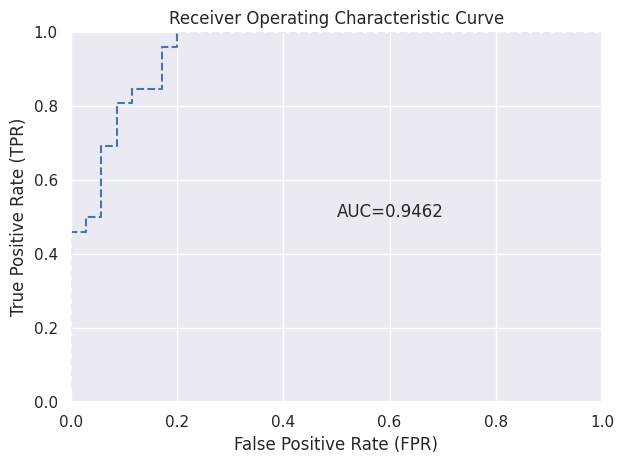

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.02857142857142857,
  0.02857142857142857,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.05714285714285714,
  0.08571428571428572,
  0.08571428571428572,
  0.08571428571428572,
  0.08571428571428572,
  0.11428571428571428,
  0.11428571428571428,
  0.14285714285714285,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.17142857142857143,
  0.2,
  0.2,
  0.22857142857142856,
  0.2571428571428571,
  0.2857142857142857,
  0.3142857142857143,
  0.34285714285714286,
  0.37142857142857144,
  0.4,
  0.42857142857142855,
  0.45714285714285713,
  0.4857142857142857,
  0.5142857142857142,
  0.5428571428571428,
  0.5714285714285714,
  0.6,
  0.6285714285714286,
  0.6571428571428571,
  0.6857142857142857,
  0.7142857142857143,
  0.7428571428571429,
  0.7714285714285715,
  0.8,
  0.8285714285714286,
  0.8571428571428571,

In [231]:
ensemble_perf.plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_BestOfFamily_1_AutoML_3_20230409_200903

,Abnormal,Normal,Error,Rate
Abnormal,173.0,2.0,0.0114,(2.0/175.0)
Normal,4.0,70.0,0.0541,(4.0/74.0)
Total,177.0,72.0,0.0241,(6.0/249.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

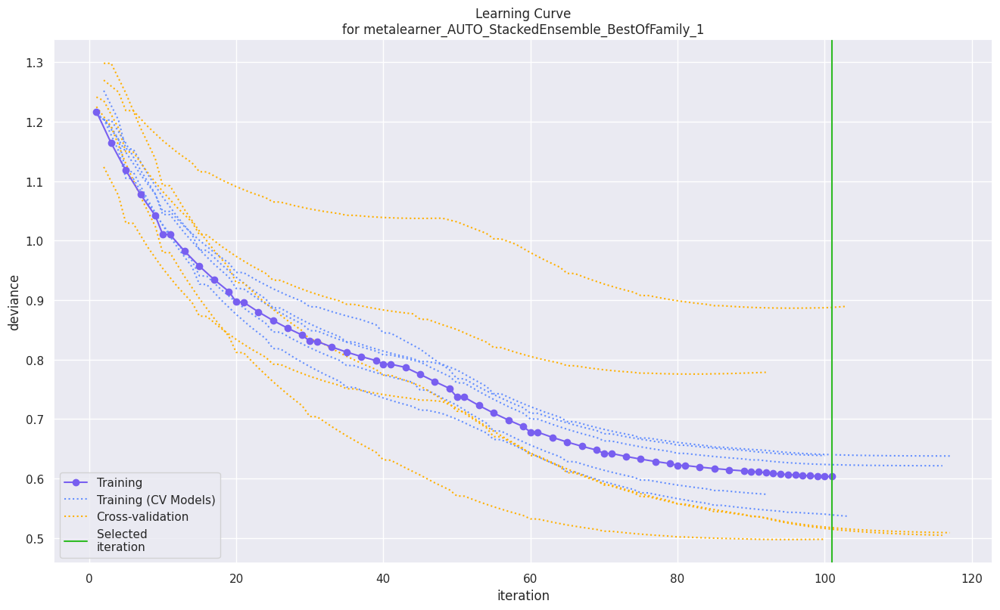

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

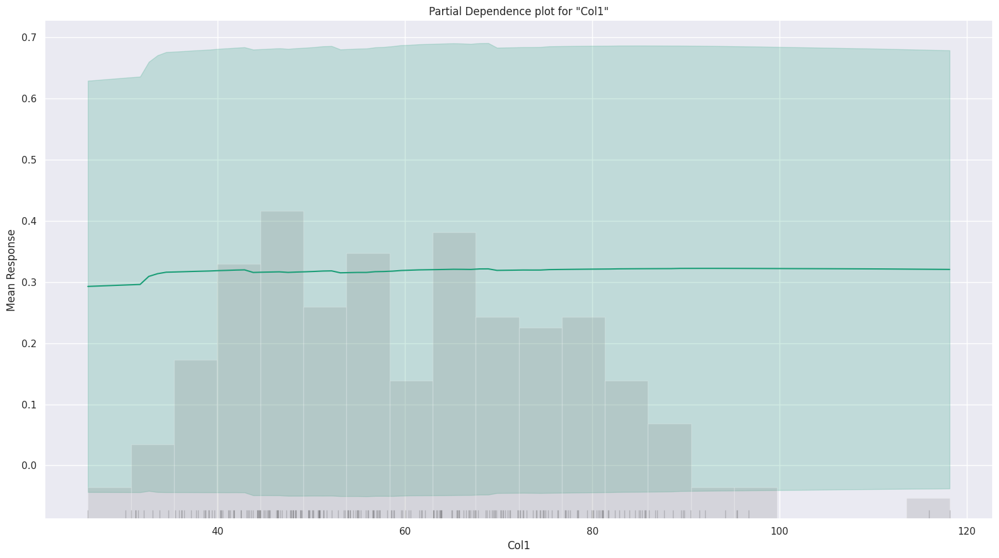

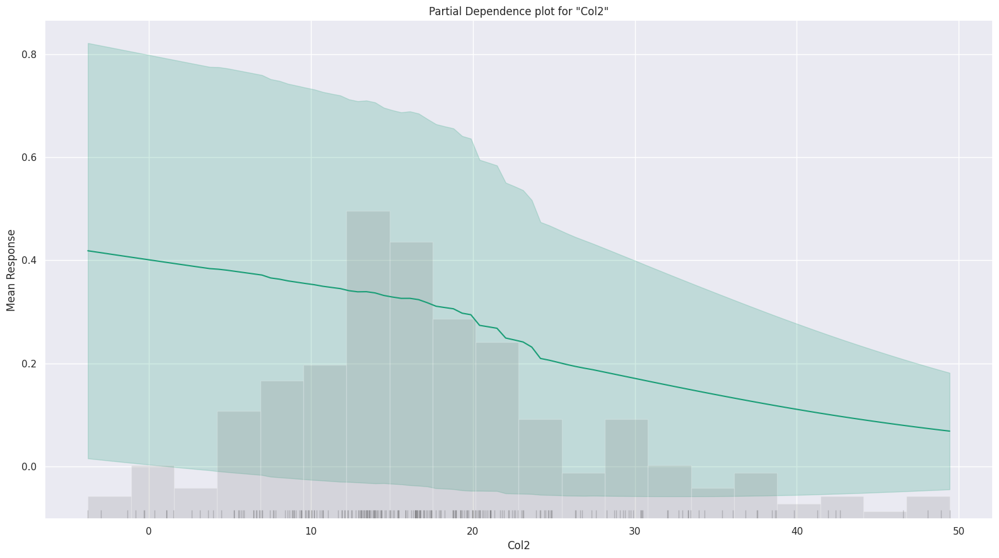

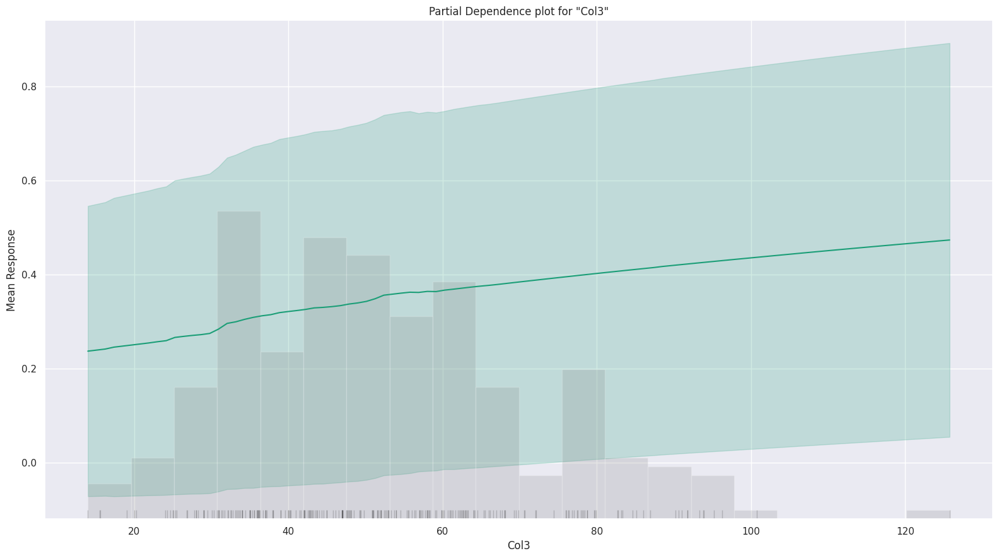

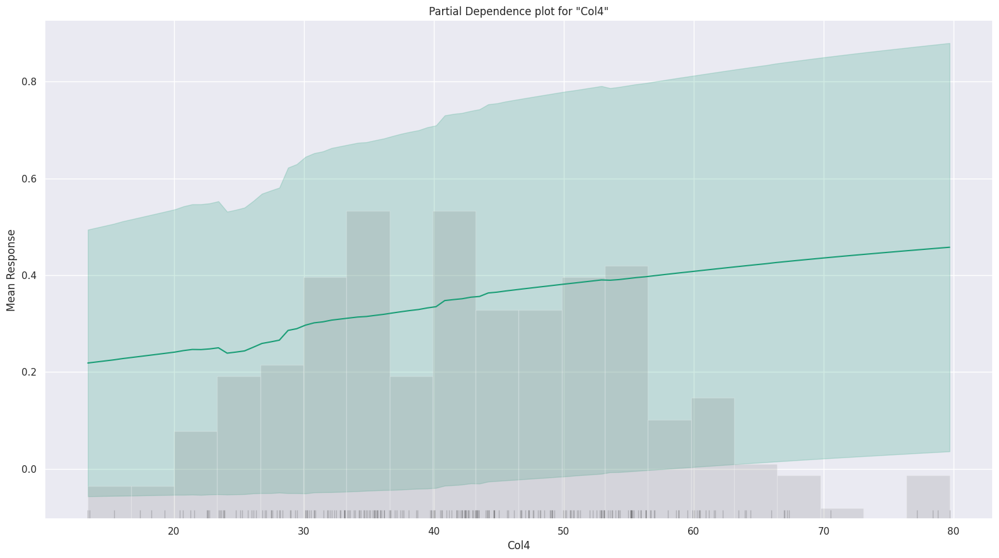

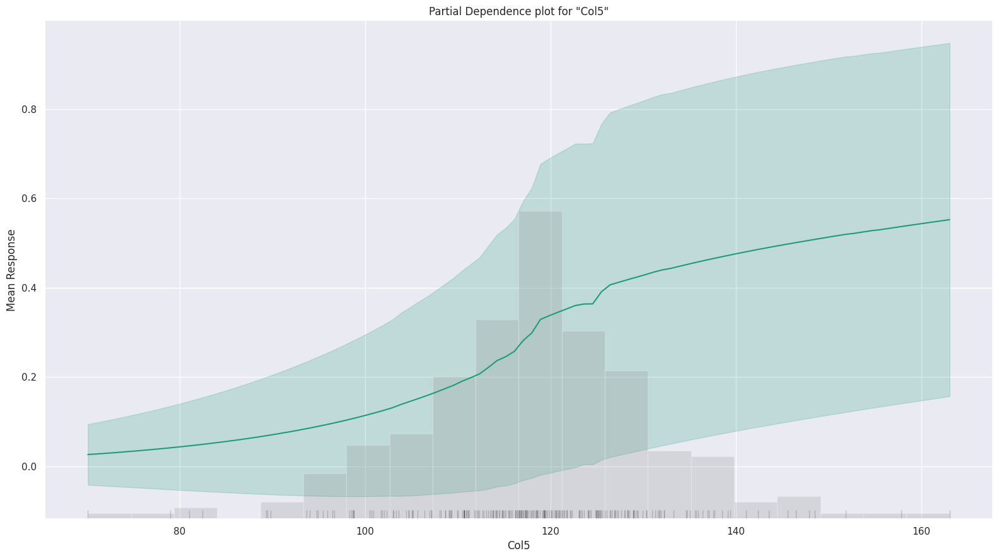

...

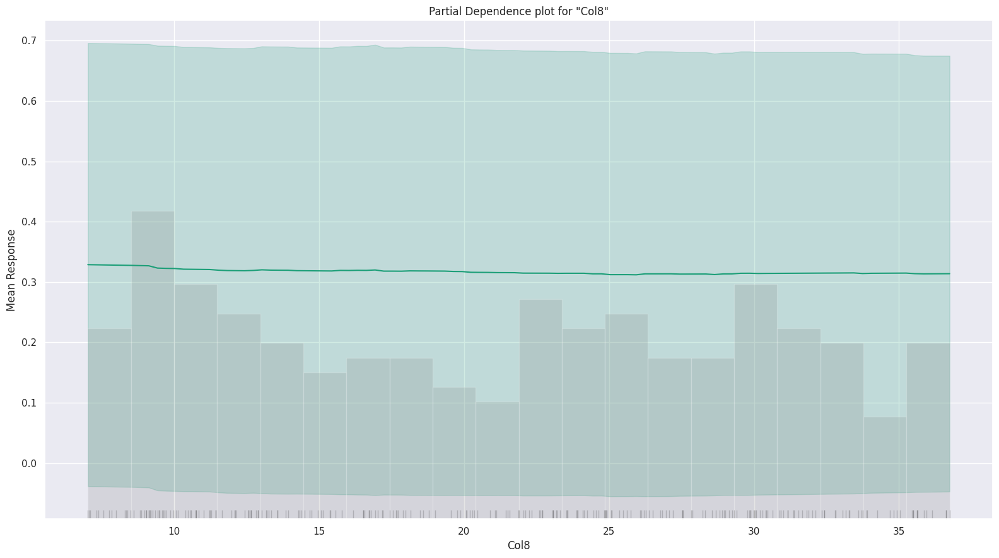

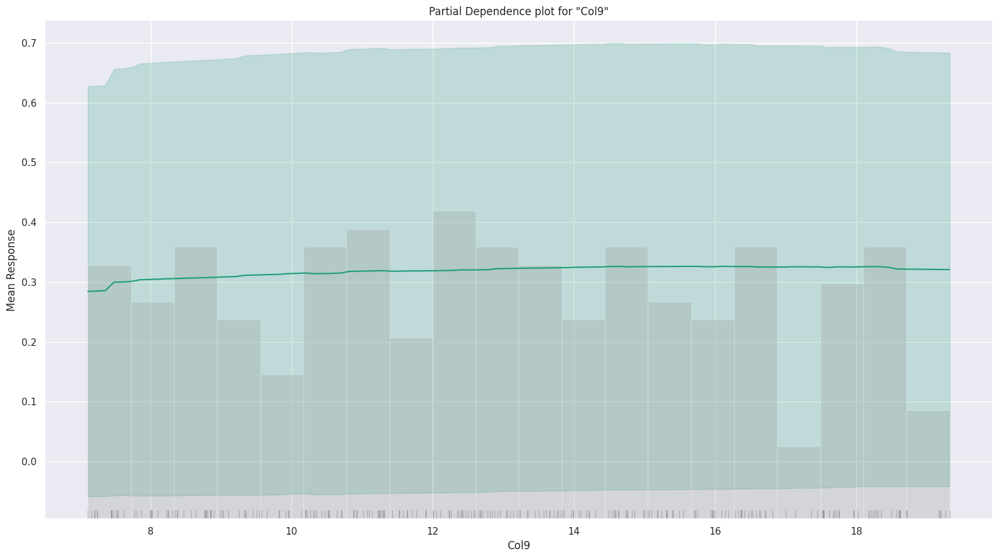

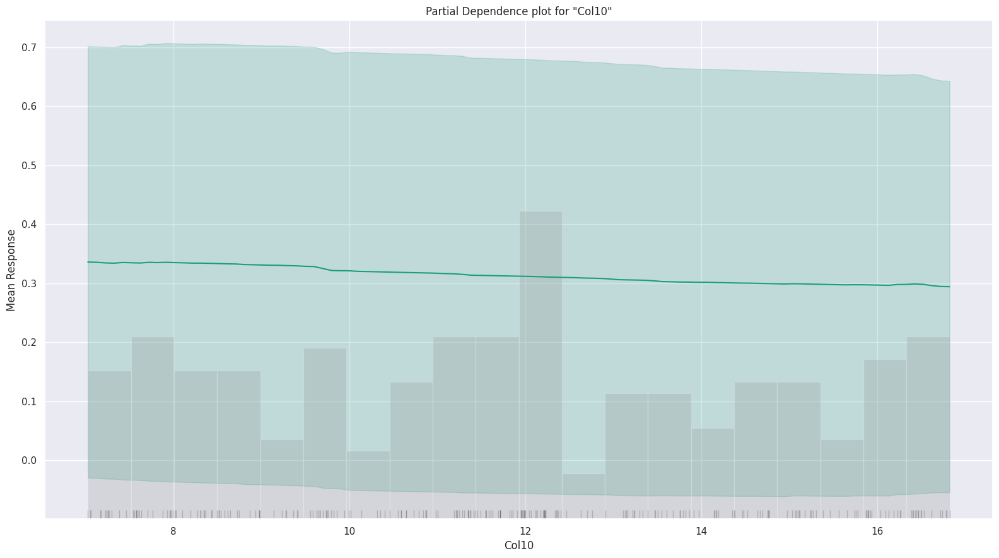

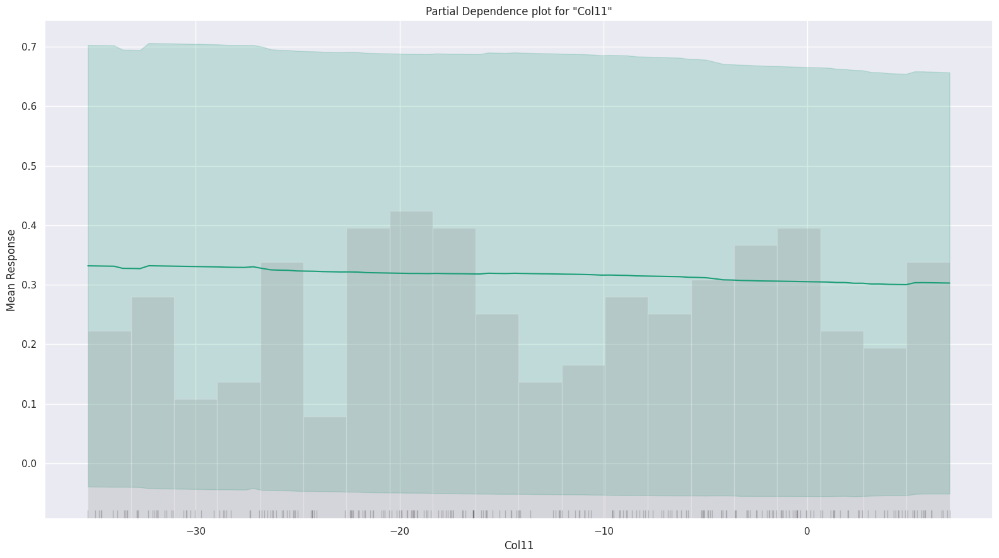

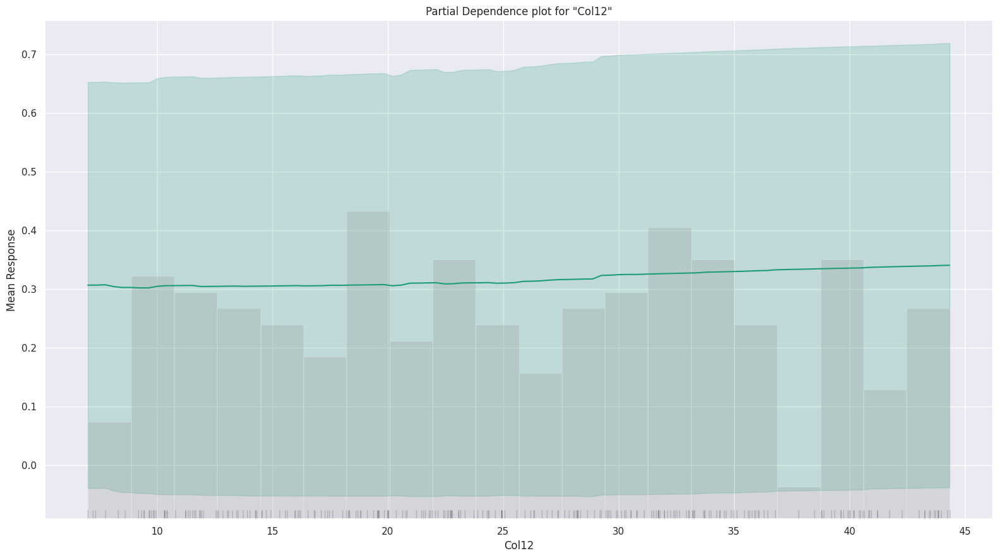

In [232]:
fi = aml.leader.explain(train)

The model uses 11 base models, including 4 GBM, 5 XGBoost, and 2 DeepLearning models. The metalearner algorithm used is GLM, with a stacking strategy of cross-validation. The model was trained on a binary classification problem and evaluated using the following metrics on the training data:

* Mean Squared Error (MSE): 0.0381630391483059
* Root Mean Squared Error (RMSE): 0.19535362588983574
* Log Loss: 0.14305741492272991
* Area Under Curve (AUC): 0.9934362934362935
* Area Under Precision-Recall Curve (AUCPR): 0.9865806133919375
* Gini: 0.9868725868725869

The confusion matrix shows the performance of the model at the optimal threshold (0.3843523015206794) for the F1 score, which is the highest F1 score obtained by the model. At this threshold, the model has an error rate of 10.42%, with 624 false positives and 420 false negatives. The maximum metrics at their respective thresholds are also shown, including the maximum F1 score, F2 score, F0.5 score, accuracy, precision, recall, specificity, absolute MCC, min per-class accuracy, and mean per-class accuracy.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

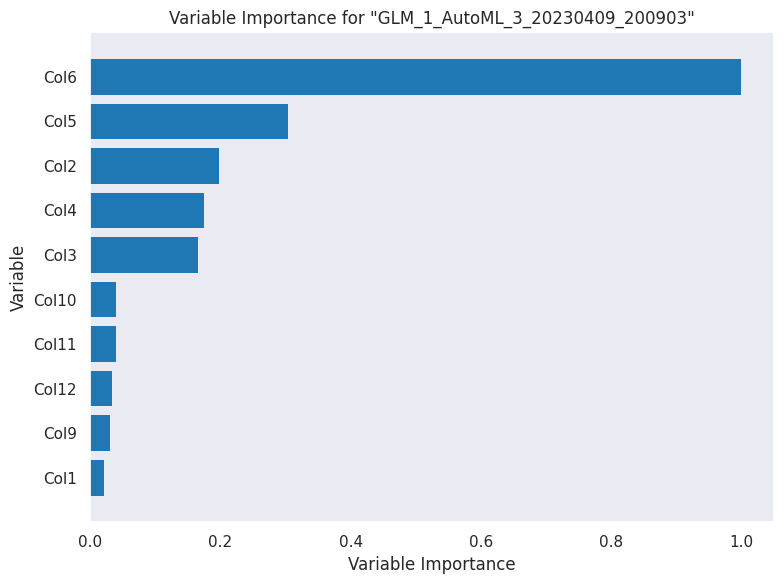

In [233]:
explain_model = aml.explain(frame = test, figsize = (8,6),include_explanations=['varimp'])

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

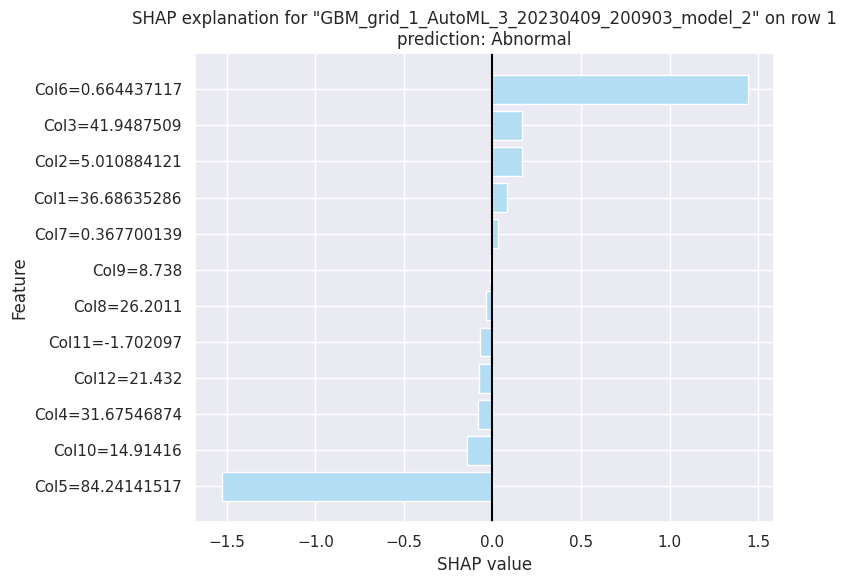

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [234]:
aml.explain_row(frame = test, row_index = 1, figsize = (8,6), exclude_explanations = "leaderboard")

# SHAP Analysis

In [235]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt

In [236]:
data = pd.read_csv("https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv")
one_hot_encoded = pd.get_dummies(data, columns=['Class_att'])
df_encoded = pd.concat([data, one_hot_encoded], axis=1)

# Remove the original column since it's no longer needed
df_encoded.drop('Class_att', axis=1, inplace=True)

df_treat = pd.get_dummies(data)
df_treat.dtypes.value_counts()
df_treat = df_treat.rename(columns=({'Class_att_Abnormal':'Abnormal','Class_att_Normal':'Normal'}))
df_treat.head(10)

temp= [df_treat['Abnormal'],df_treat['Normal']]
y= pd.DataFrame(temp)
y= y.transpose()
x = df_treat.drop(columns=['Abnormal','Normal'])

In [237]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)
     

In [238]:
print(x, y)

          Col1       Col2       Col3       Col4        Col5       Col6  \
0    63.027817  22.552586  39.609117  40.475232   98.672917  -0.254400   
1    39.056951  10.060991  25.015378  28.995960  114.405425   4.564259   
2    68.832021  22.218482  50.092194  46.613539  105.985135  -3.530317   
3    69.297008  24.652878  44.311238  44.644130  101.868495  11.211523   
4    49.712859   9.652075  28.317406  40.060784  108.168725   7.918501   
..         ...        ...        ...        ...         ...        ...   
305  47.903565  13.616688  36.000000  34.286877  117.449062  -4.245395   
306  53.936748  20.721496  29.220534  33.215251  114.365845  -0.421010   
307  61.446597  22.694968  46.170347  38.751628  125.670725  -2.707880   
308  45.252792   8.693157  41.583126  36.559635  118.545842   0.214750   
309  33.841641   5.073991  36.641233  28.767649  123.945244  -0.199249   

         Col7     Col8     Col9     Col10  ...  \
0    0.744503  12.5661  14.5386  15.30468  ...   
1    0.4151

In [239]:
catagorical_features = []
numerical_features = [c for c in X_train.columns if c not in catagorical_features]
cat = [([c], [OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num + cat, df_out=True)
preprocessed_X_train = mapper.fit_transform(X_train)
preprocessed_X_train = sm.add_constant(preprocessed_X_train)
reg = sm.OLS(y_train, preprocessed_X_train).fit()
     

In [240]:

def evaluate(X, y, mapper=None, reg=None, transform=False):
    if transform:
        X = mapper.transform(X)
        X = sm.add_constant(X, has_constant='add') 
    y_pred = reg.predict(X)
    return mean_absolute_error(y, y_pred)

In [241]:

train_mae = evaluate(X_train, y_train, mapper, reg, True)
test_mae = evaluate(X_test, y_test, mapper, reg, True)
print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)} ")

train MAE = 0.29, test MAE = 0.519 


In [242]:
from sklearn.ensemble import RandomForestRegressor
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)
catagorical_features = []
numerical_features = [c for c in X_train.columns if c not in catagorical_features]
cat = [([c], [OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num + cat, df_out=True)
reg = RandomForestRegressor()
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', reg)
])
p = pipeline.fit(X_train, y_train)

train_mae = evaluate(X_train, y_train, reg=pipeline)
test_mae = evaluate(X_test, y_test, reg=pipeline)
print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)} ")

train MAE = 0.07, test MAE = 0.399 


In [243]:
print(reg)

RandomForestRegressor()


In [244]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False) #revert
catagorical_features = []
numerical_features = [c for c in X_train.columns if c not in catagorical_features]
cat = [([c], [SimpleImputer(strategy='constant', fill_value=0),
              OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num + cat, df_out=True)
reg = LinearRegression()
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', reg)
])
p = pipeline.fit(X_train, y_train)
     

In [245]:
nan_frame = pd.DataFrame(columns=catagorical_features+numerical_features, index=[0])
nan_frame

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,...,Unnamed: 13_ Attribute8= Direct_tilt(numeric),Unnamed: 13_ Attribute9= thoracic_slope(numeric),"Unnamed: 13_Attribute class {Abnormal, Normal}",Unnamed: 13_Attribute1 = pelvic_incidence (numeric),Unnamed: 13_Attribute2 = pelvic_tilt (numeric),Unnamed: 13_Attribute3 = lumbar_lordosis_angle (numeric),Unnamed: 13_Attribute4 = sacral_slope (numeric),Unnamed: 13_Attribute5 = pelvic_radius (numeric),Unnamed: 13_Attribute6 = degree_spondylolisthesis (numeric),Unnamed: 13_Prediction is done by using binary classification.
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [246]:
X_test.iloc[0: 1]

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,...,Unnamed: 13_ Attribute8= Direct_tilt(numeric),Unnamed: 13_ Attribute9= thoracic_slope(numeric),"Unnamed: 13_Attribute class {Abnormal, Normal}",Unnamed: 13_Attribute1 = pelvic_incidence (numeric),Unnamed: 13_Attribute2 = pelvic_tilt (numeric),Unnamed: 13_Attribute3 = lumbar_lordosis_angle (numeric),Unnamed: 13_Attribute4 = sacral_slope (numeric),Unnamed: 13_Attribute5 = pelvic_radius (numeric),Unnamed: 13_Attribute6 = degree_spondylolisthesis (numeric),Unnamed: 13_Prediction is done by using binary classification.
279,48.801909,18.017762,52.0,30.784147,139.150407,10.442862,0.105014,26.1245,19.2659,8.31303,...,0,0,0,0,0,0,0,0,0,0


In [247]:
explainer = shap.Explainer(pipeline.predict, X_train)
shap_values = explainer(X_test)
     

Permutation explainer: 32it [00:26,  1.35s/it]


In [248]:
def partial_dependence_plot(feature, idx=None):
    if idx is None: # visualize all samples
        shap.plots.partial_dependence(
            feature,
            pipeline.predict,
            X_train, 
            ice=False,
            model_expected_value=True, 
            feature_expected_value=True)
    else: # visualize sample idx
        shap.partial_dependence_plot(
            feature, 
            pipeline.predict,
            X_train, 
            ice=False,
            model_expected_value=True, 
            feature_expected_value=True,
            shap_values=shap_values[idx:idx+1,:])

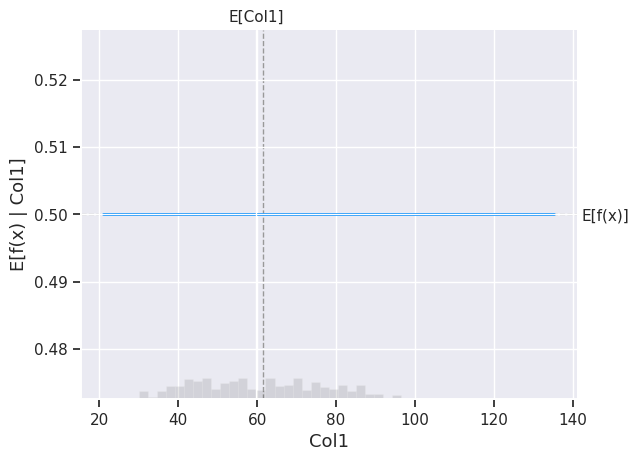

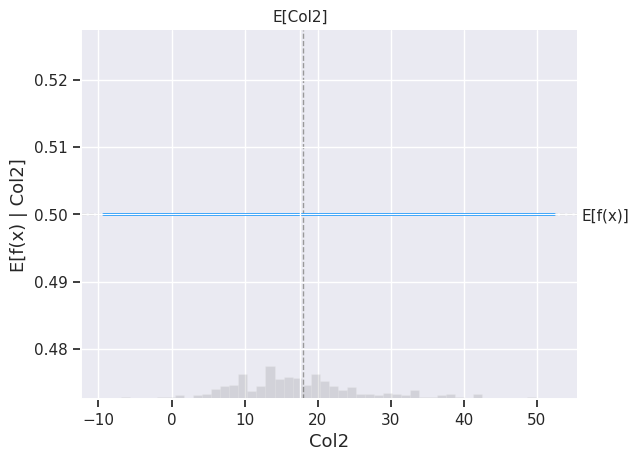

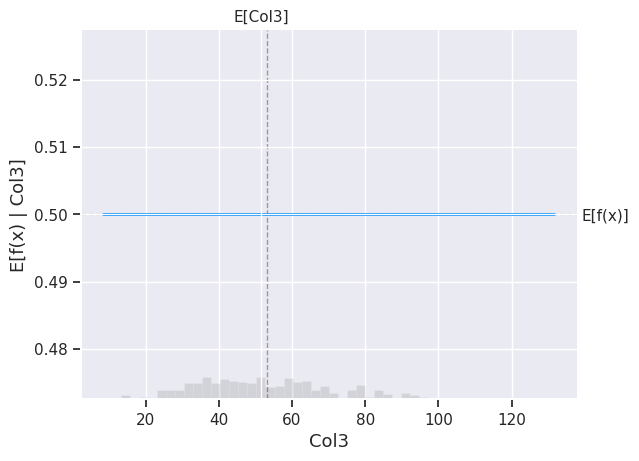

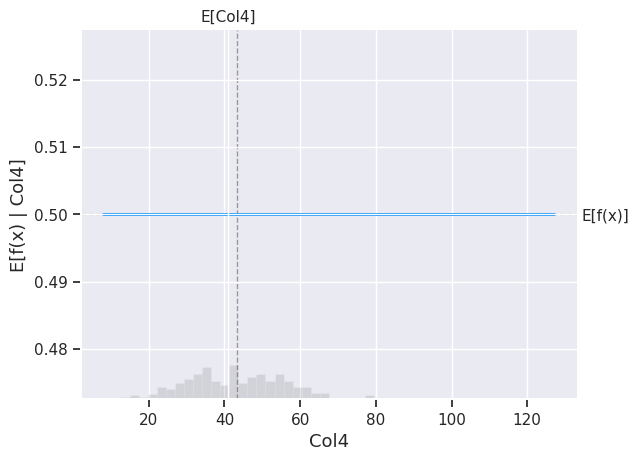

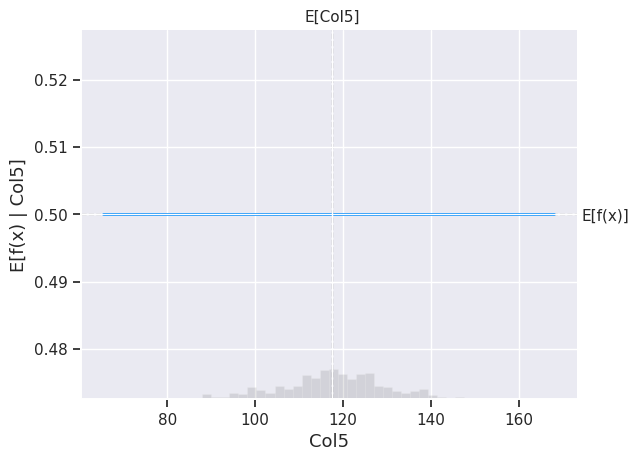

...

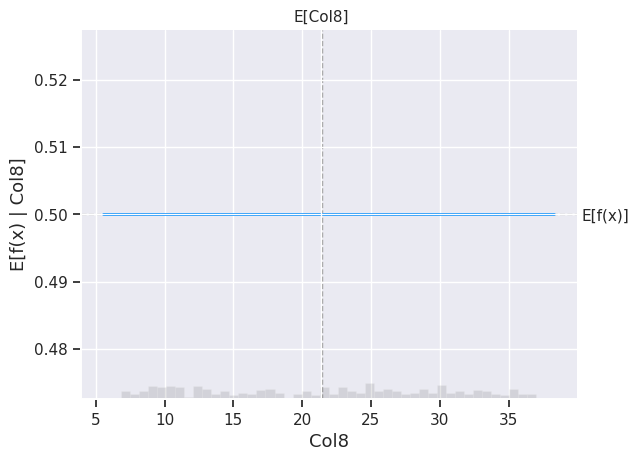

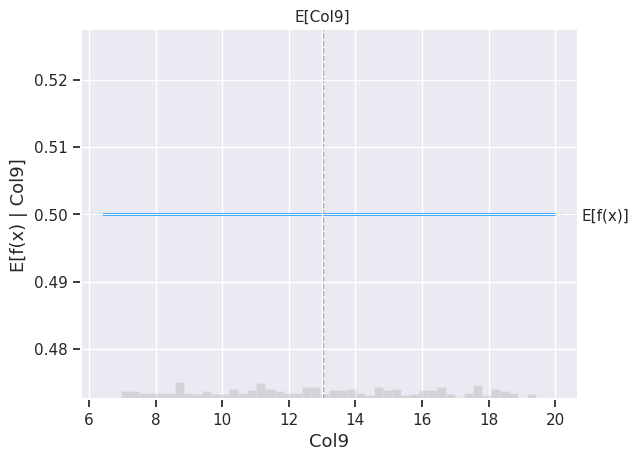

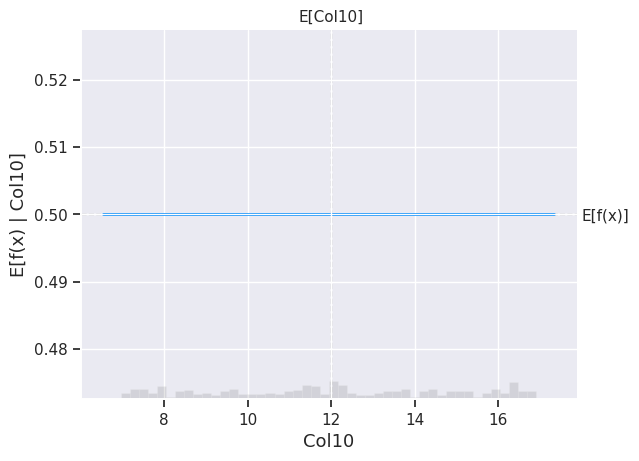

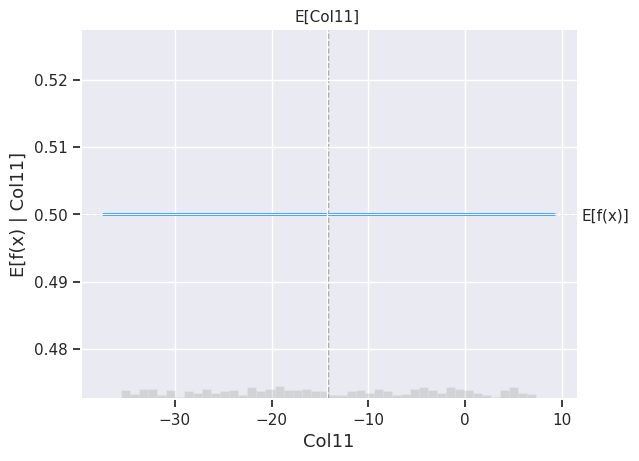

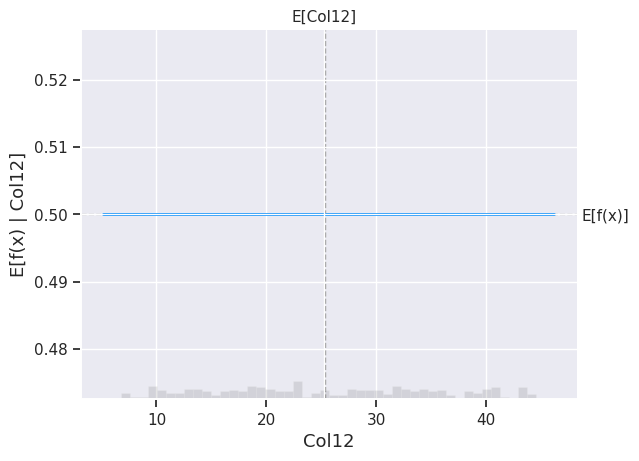

In [249]:
partial_dependence_plot('Col1')
     
partial_dependence_plot('Col2')     

partial_dependence_plot('Col3')
     
partial_dependence_plot('Col4')
    
partial_dependence_plot('Col5')
     
partial_dependence_plot('Col6')
     
partial_dependence_plot('Col7')
     
partial_dependence_plot('Col8')
     
partial_dependence_plot('Col9')
     
partial_dependence_plot('Col10')
     
partial_dependence_plot('Col11')
     
partial_dependence_plot('Col12')

# Regression with scikit-learn

This uses the model-agnostic KernelExplainer and the TreeExplainer to explain several different regression models trained on a small diabetes dataset. This notebook is meant to give examples of how to use KernelExplainer for various models.

**Load Data**

In [250]:
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
import shap
import time

data = pd.read_csv("https://raw.githubusercontent.com/jainam240101/Data-Science-Assignments/main/Assignment%201/Dataset_spine.csv")

one_hot_encoded = pd.get_dummies(data, columns=['Class_att'])
df_encoded = pd.concat([data, one_hot_encoded], axis=1)

# Remove the original column since it's no longer needed
df_encoded.drop('Class_att', axis=1, inplace=True)

df_treat = pd.get_dummies(data)
df_treat.dtypes.value_counts()
df_treat = df_treat.rename(columns=({'Class_att_Abnormal':'Abnormal','Class_att_Normal':'Normal'}))
df_treat.head(10)

temp= [df_treat['Abnormal'],df_treat['Normal']]

y= pd.DataFrame(temp)
y= y.transpose()
x = df_treat.drop(columns=['Abnormal','Normal'])

X_train,X_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=0)

# rather than use the whole training set to estimate expected values, we summarize with
# a set of weighted kmeans, each weighted by the number of points they represent.
X_train_summary = shap.kmeans(X_train, 10)

def print_accuracy(f):
    print("Root mean squared test error = {0}".format(np.sqrt(np.mean((f(X_test) - y_test)**2))))
    time.sleep(0.5) # to let the print get out before any progress bars

shap.initjs()


**Linear regression**

In [251]:

from sklearn import linear_model
lin_regr = linear_model.LinearRegression()
lin_regr.fit(X_train, y_train)

print_accuracy(lin_regr.predict)
     

Root mean squared test error = Abnormal    0.404347
Normal      0.404347
dtype: float64


**Explain a single prediction from the test set**

In [252]:
shap.initjs()
ex = shap.KernelExplainer(lin_regr.predict, X_train_summary)
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value[0], shap_values[0])

  0%|          | 0/62 [00:00<?, ?it/s]

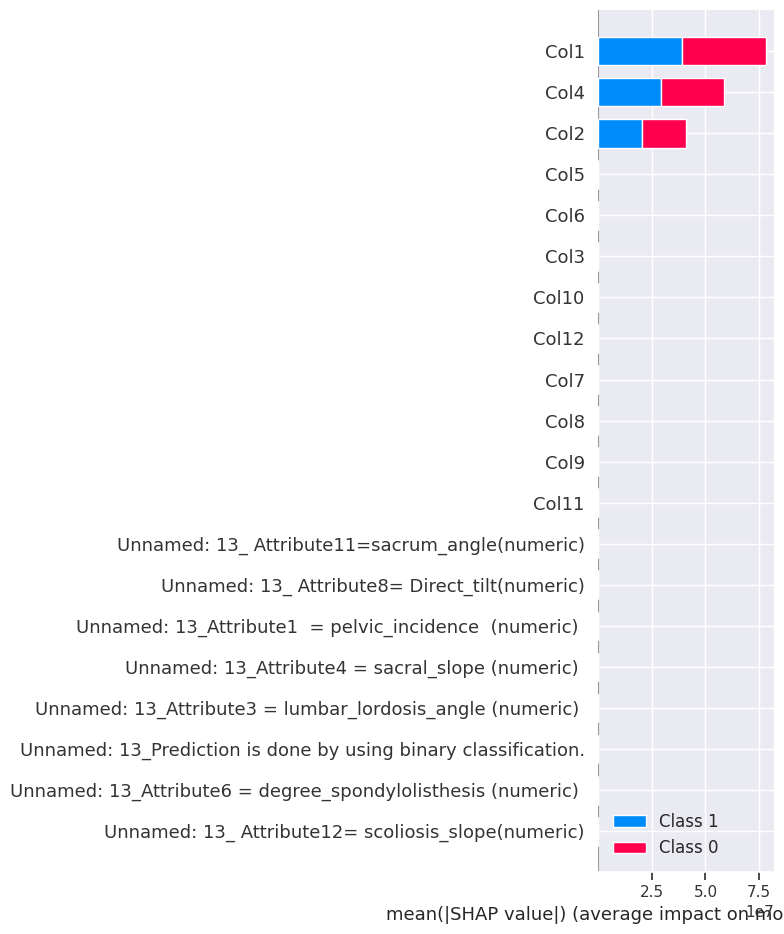

In [253]:

shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

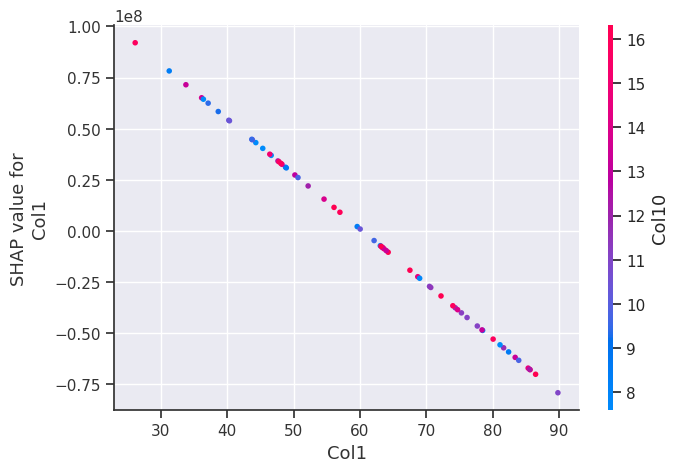

In [254]:
shap.dependence_plot("Col1", shap_values[0], X_test)

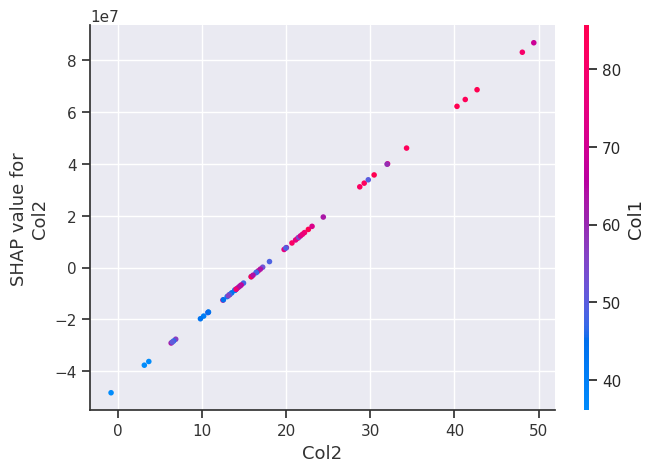

In [255]:
shap.dependence_plot("Col2", shap_values[0], X_test)

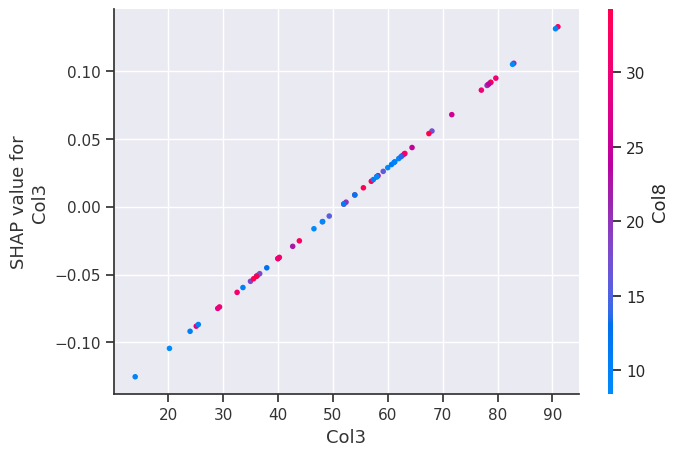

In [256]:
shap.dependence_plot("Col3", shap_values[0], X_test)


In [257]:
shap.initjs()
shap.force_plot(ex.expected_value[0], shap_values[0])

# **Decision tree regressor**

Root mean squared test error = Abnormal    0.41969
Normal      0.41969
dtype: float64


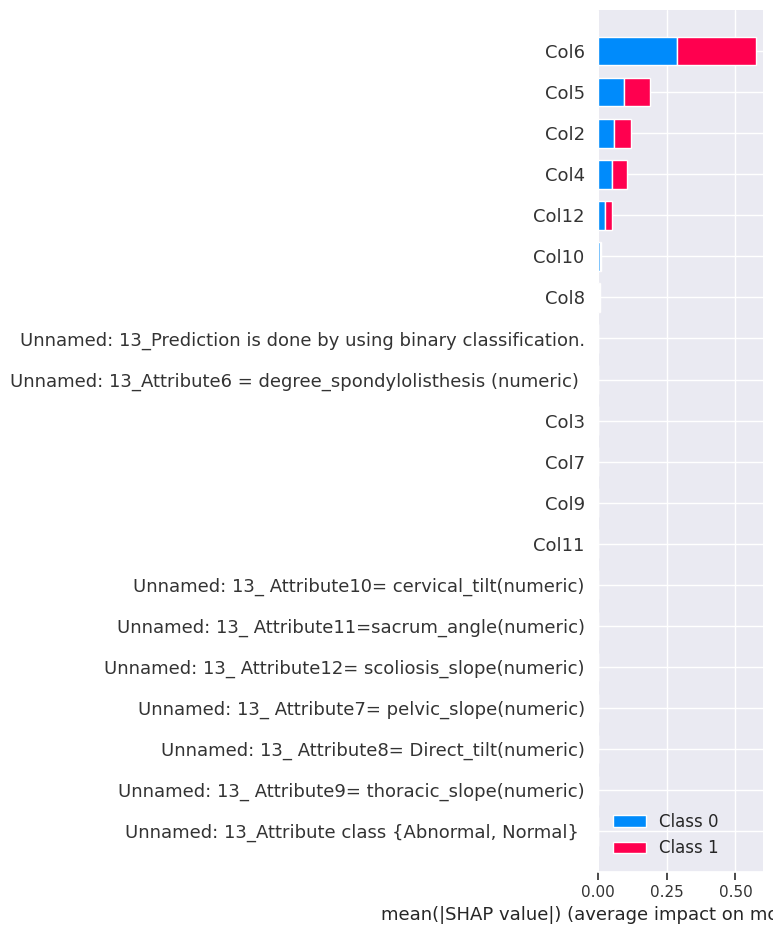

In [258]:
from sklearn import tree
dtree = tree.DecisionTreeRegressor(min_samples_split=20)
dtree.fit(X_train, y_train)
print_accuracy(dtree.predict)

# explain all the predictions in the test set
ex = shap.TreeExplainer(dtree)
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

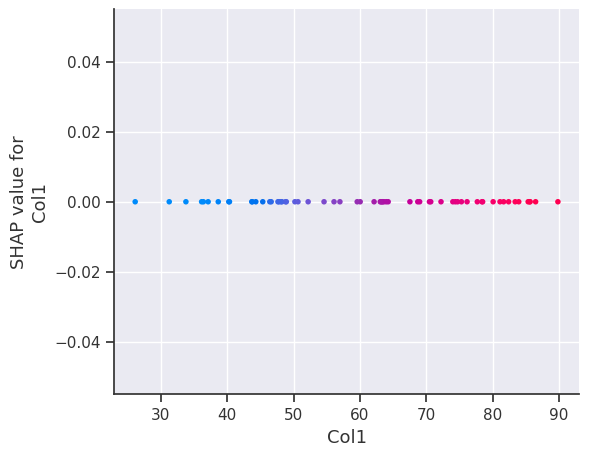

In [259]:
shap.dependence_plot("Col1", shap_values[0],X_test)

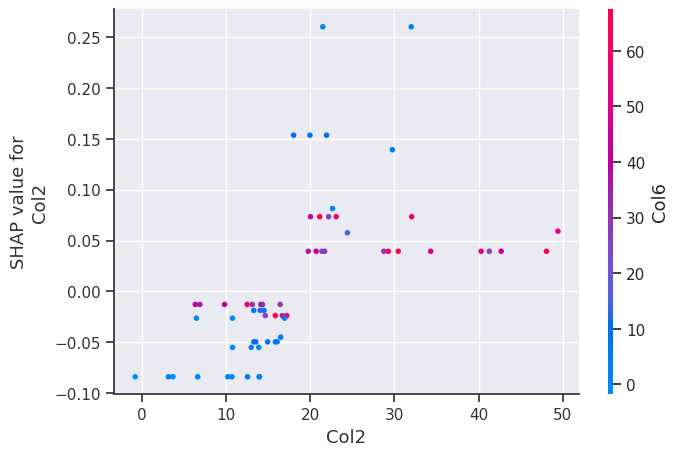

In [260]:
shap.dependence_plot("Col2", shap_values[0],X_test)

In [261]:
shap.initjs()
shap.force_plot(ex.expected_value[0], shap_values[0])

# Random forest

Using the fast TreeExplainer implementation.

Root mean squared test error = Abnormal    0.38013
Normal      0.38013
dtype: float64


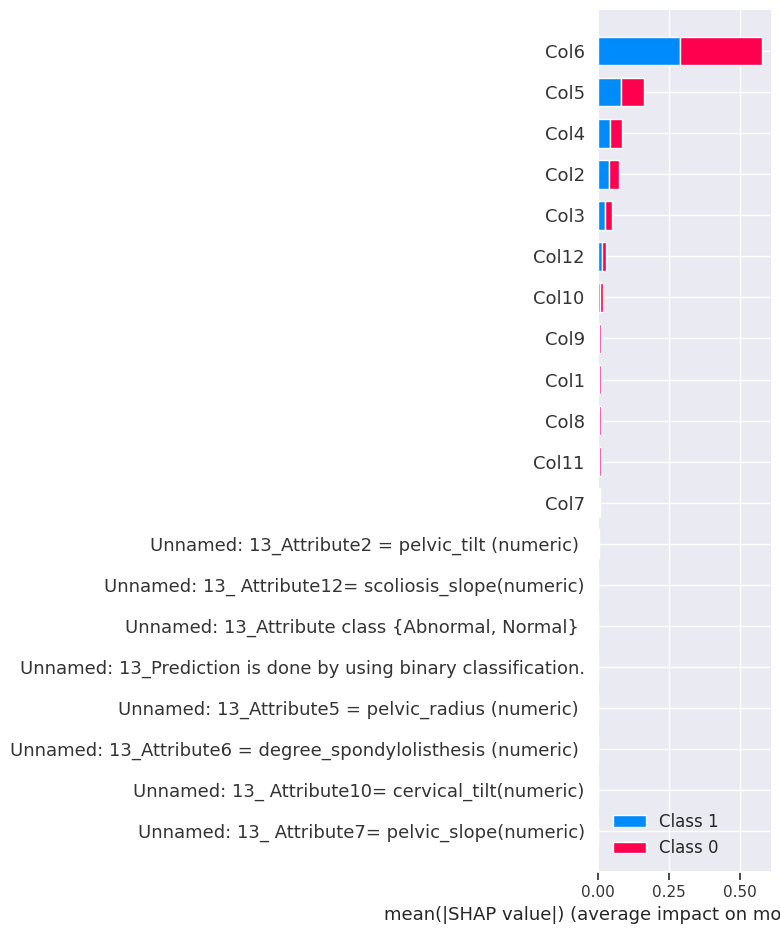

In [262]:
from sklearn.ensemble import RandomForestRegressor
rforest = RandomForestRegressor(n_estimators=1000, max_depth=None, min_samples_split=2, random_state=0)
rforest.fit(X_train, y_train)
print_accuracy(rforest.predict)

# explain all the predictions in the test set
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)
     

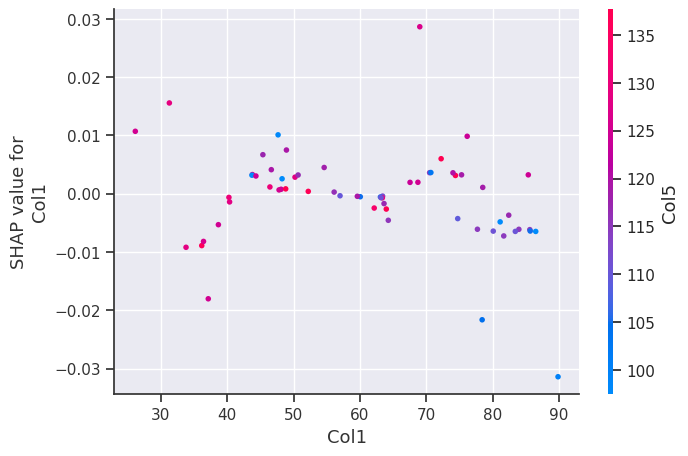

In [263]:
shap.dependence_plot("Col1", shap_values[0], X_test)

In [264]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0])

**1. What is the question?**

I choose a dataset from Kaggle which was a categorical dataset indicating if the give information can cause an abnormal spine or normal spine. Parameters or measurements that are used to assess spinal alignment and curvature in orthopedic medicine are the column data which is available to us. We will use this information to perform actions on the dataset and make predictions for unknown data.

**2. What did you do?**

To get the best results we will try out different algorithms like Linear Regression, Decison Tree Classifier, Logistic Regression with using library like AutoML which will test out other algorithms and also do Hyperparameter tuning to get the best results. We will also do some SHAP analysis to understand the contribution of each input feature or variable to the final prediction of a model. 


**3. How well did it work?**

Stacked Ensemble was the algorithm suggested by AutoML which has RMSE value of  0.19251830591539235 which indicates better predictive accuracy of the model. Removing outliers also helped increase the accuracy for the testing set. After testing out values which were not involved in the set also came to be accurate so we can say that the model has been fine tuned properly to make accurate predictions to find out if the person has abnormal or normal spine 


**4. What did you learn?**
After performing things like Data Cleaning, Feature Selection, Modeling, and Interpretability I understood how to use the machine learning algorithms and also on using libraries like AutoML and Scikit Learn to fit the data in algorithms and make predictions. I also learnt on how to use matplotlib for creating the graphs of ROC curve, SHAP analysis and error graphs to check how well do algorithms run 

## License 

MIT License

Copyright (c) 2023 Jainam Mehta

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.